In [3]:
import nltk
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
# Download stop words list and punkt tokenizer (if not previously downloaded)
nltk.download('stopwords')
nltk.download('punkt')
!pip install gensim
!pip install pyLDAvis
!pip install wordcloud matplotlib

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 18.4 MB/s eta 0:00:00


In [4]:
!wget -P data/full_dataset/ https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_1.csv
!wget -P data/full_dataset/ https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_2.csv
!wget -P data/full_dataset/ https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_3.csv

--2024-11-17 12:21:42--  https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_1.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.23.207, 74.125.203.207, 74.125.204.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.23.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14174600 (14M) [application/octet-stream]
Saving to: ‘data/full_dataset/goemotions_1.csv’

goemotions_1.csv    100%[===================>]  13.52M  10.6MB/s    in 1.3s    

2024-11-17 12:21:44 (10.6 MB/s) - ‘data/full_dataset/goemotions_1.csv’ saved [14174600/14174600]

--2024-11-17 12:21:44--  https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_2.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.23.207, 74.125.203.207, 74.125.204.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.23.207|:443... connected.
HTTP request sent, awaiting response.

In [5]:
goemotions_1 = pd.read_csv('data/full_dataset/goemotions_1.csv')
goemotions_2 = pd.read_csv('data/full_dataset/goemotions_2.csv')
goemotions_3 = pd.read_csv('data/full_dataset/goemotions_3.csv')

combined_df = pd.concat([goemotions_1, goemotions_2, goemotions_3], ignore_index=True)
emotion_columns = combined_df.columns[9:]

combined_df['created_utc'] = pd.to_datetime(combined_df['created_utc'], unit='s', errors='coerce')
combined_df.to_csv('data/full_dataset/goemotions_combined.csv', index=False)

בניית מילון רגשות


In [4]:
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import defaultdict
import re
import nltk
from nltk.corpus import stopwords
from collections import defaultdict, Counter
import pandas as pd

def preprocess_text(text, stop_words):
    text = re.sub(r'\W+', ' ', text)
    words = text.lower().split()
    words = [word for word in words if word not in stop_words]
    return words


def get_most_common_words(text_series, top_n=20):
    all_words = []
    for text in text_series:
        words = text.split()
        all_words.extend(words)

    word_counts = Counter(all_words)
    most_common_words = word_counts.most_common(top_n)
    return [word for word, _ in most_common_words]


def build_emotion_word_dict(df, text_column, emotion_columns, top_n_words=20):
    stop_words = list(stopwords.words('english'))

    emotion_word_dict = defaultdict(dict)

    for emotion in emotion_columns:

        emotion_df = df[df[emotion] == 1][text_column]


        processed_texts = emotion_df.apply(lambda x: preprocess_text(x, stop_words)).tolist()


        processed_texts = [' '.join(text) for text in processed_texts if text]

        if len(processed_texts) == 0:
            print(f"No valid texts found for emotion: {emotion}")
            continue


        tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words, max_features=top_n_words)
        try:
            tfidf_matrix = tfidf_vectorizer.fit_transform(processed_texts)
            top_tfidf_words = tfidf_vectorizer.get_feature_names_out()
            emotion_word_dict[emotion]['tfidf_words'] = list(top_tfidf_words)
        except ValueError as e:
            print(f"Error processing emotion '{emotion}': {e}")
            emotion_word_dict[emotion]['tfidf_words'] = []


        common_words = get_most_common_words(processed_texts, top_n=top_n_words)
        emotion_word_dict[emotion]['common_words'] = common_words

    return emotion_word_dict


text_column = 'text'

emotion_word_dict = build_emotion_word_dict(combined_df, text_column, emotion_columns, top_n_words=20)

for emotion, words in emotion_word_dict.items():
    tfidf_words = ', '.join(words.get('tfidf_words', []))
    common_words = ', '.join(words.get('common_words', []))
    print(f"Top words for {emotion}:")
    print(f"  TF-IDF Words: {tfidf_words}")
    print(f"  Common Words: {common_words}")
    print("\n")

def emotion_word_dict_to_df(emotion_word_dict):
    data = []

    for emotion, words in emotion_word_dict.items():
        tfidf_words = ', '.join(words.get('tfidf_words', []))
        common_words = ', '.join(words.get('common_words', []))

        data.append([emotion, tfidf_words, common_words])

    df = pd.DataFrame(data, columns=['Emotion', 'TF-IDF Words', 'Common Words'])

    return df

emotion_word_df = emotion_word_dict_to_df(emotion_word_dict)



Top words for admiration:
  TF-IDF Words: amazing, awesome, beautiful, best, get, good, great, like, looks, love, much, name, nice, one, pretty, really, thanks, well, would, wow
  Common Words: name, good, great, like, love, awesome, one, amazing, really, best, pretty, nice, would, wow, beautiful, looks, well, get, thanks, much


Top words for amusement:
  TF-IDF Words: actually, fun, funny, get, good, got, haha, hilarious, joke, know, like, lmao, lol, love, name, one, people, really, think, would
  Common Words: lol, name, haha, like, funny, fun, lmao, one, would, good, people, love, really, joke, think, get, know, got, hilarious, actually


Top words for anger:
  TF-IDF Words: damn, even, fuck, fucking, get, go, hate, hell, know, like, name, one, people, really, shit, stop, stupid, think, want, would
  Common Words: name, fuck, hate, like, fucking, people, get, shit, one, would, damn, stupid, hell, really, even, go, stop, know, think, want


Top words for annoyance:
  TF-IDF Words: b

In [18]:
import json
import os
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter, defaultdict
import re
import nltk
from nltk.corpus import stopwords
import pandas as pd

def preprocess_text(text, stop_words):
    text = re.sub(r'\W+', ' ', text)
    words = text.lower().split()
    words = [word for word in words if word not in stop_words]
    return words

stop_words = list(stopwords.words('english'))

def get_most_common_words(text_series, top_n=20):
    all_words = []
    for text in text_series:
        words = text.split()
        all_words.extend(words)
    word_counts = Counter(all_words)
    most_common_words = word_counts.most_common(top_n)
    return [word for word, _ in most_common_words]

def compute_metrics_for_emotion(emotion, df, text_column, top_n_words=20):
    stop_words = list(stopwords.words('english'))

    emotion_df = df[df[emotion] == 1][text_column]

    if emotion_df.empty:
        print(f"No data for emotion: {emotion}")
        return {emotion: {'tfidf_words': [], 'common_words': [], 'log_tf': {}}}

    processed_texts = emotion_df.apply(lambda x: preprocess_text(x, stop_words)).tolist()
    processed_texts = [' '.join(text) for text in processed_texts if text]

    if len(processed_texts) == 0:
        print(f"No valid texts for emotion: {emotion}")
        return {emotion: {'tfidf_words': [], 'common_words': [], 'log_tf': {}}}

    tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words, max_features=top_n_words)
    tfidf_matrix = tfidf_vectorizer.fit_transform(processed_texts)
    top_tfidf_words = tfidf_vectorizer.get_feature_names_out()

    common_words = get_most_common_words(processed_texts, top_n=top_n_words)

    word_indices = {word: idx for idx, word in enumerate(top_tfidf_words)}
    log_tf = {word: np.log1p(tfidf_matrix[:, word_indices[word]].sum()) for word in top_tfidf_words}

    return {
        emotion: {
            'tfidf_words': list(top_tfidf_words),
            'common_words': common_words,
            'log_tf': log_tf
        }
    }

def save_results_to_file(results, file_path):
    with open(file_path, 'w') as f:
        json.dump(results, f)

def load_results_from_file(file_path):
    if os.path.exists(file_path):
        with open(file_path, 'r') as f:
            return json.load(f)
    return {}

def compute_metrics_for_all_data(df, text_column, top_n_words=100):
    stop_words = list(stopwords.words('english'))

    all_texts = df[text_column].dropna().apply(lambda x: preprocess_text(x, stop_words)).tolist()
    processed_texts = [' '.join(text) for text in all_texts if text]

    if len(processed_texts) == 0:
        print("No valid texts in the dataset.")
        return {'tfidf_words': [], 'common_words': [], 'log_tf': {}}

    tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words, max_features=top_n_words)
    tfidf_matrix = tfidf_vectorizer.fit_transform(processed_texts)
    top_tfidf_words = tfidf_vectorizer.get_feature_names_out()

    common_words = get_most_common_words(processed_texts, top_n=top_n_words)

    word_indices = {word: idx for idx, word in enumerate(top_tfidf_words)}
    log_tf = {word: np.log1p(tfidf_matrix[:, word_indices[word]].sum()) for word in top_tfidf_words}

    return {
        'tfidf_words': list(top_tfidf_words),
        'common_words': common_words,
        'log_tf': log_tf
    }

results = load_results_from_file('emotion_word_metrics.json')
for emotion in emotion_columns:
    if emotion in results:
        print(f"Skipping {emotion}, already processed.")
        continue

    print(f"Processing emotion: {emotion}")
    emotion_result = compute_metrics_for_emotion(emotion, combined_df, text_column='text', top_n_words=100)
    results.update(emotion_result)

    save_results_to_file(results, 'emotion_word_metrics.json')

print("Processing all data...")
all_data_metrics = compute_metrics_for_all_data(combined_df, text_column='text', top_n_words=100)
results['all_data'] = all_data_metrics

save_results_to_file(results, 'emotion_word_metrics.json')

print("Processing completed.")


Processing emotion: admiration
Processing emotion: amusement
Processing emotion: anger
Processing emotion: annoyance
Processing emotion: approval
Processing emotion: caring
Processing emotion: confusion
Processing emotion: curiosity
Processing emotion: desire
Processing emotion: disappointment
Processing emotion: disapproval
Processing emotion: disgust
Processing emotion: embarrassment
Processing emotion: excitement
Processing emotion: fear
Processing emotion: gratitude
Processing emotion: grief
Processing emotion: joy
Processing emotion: love
Processing emotion: nervousness
Processing emotion: optimism
Processing emotion: pride
Processing emotion: realization
Processing emotion: relief
Processing emotion: remorse
Processing emotion: sadness
Processing emotion: surprise
Processing emotion: neutral
Processing all data...
Processing completed.


In [19]:
import json

# הנתיב לקובץ
file_path = 'emotion_word_metrics.json'

# קריאת הקובץ
with open(file_path, 'r') as f:
    emotion_metrics = json.load(f)

# הצגת נתונים
for emotion, metrics in emotion_metrics.items():
    print(f"Emotion: {emotion}")
    print(f"  TF-IDF Words: {', '.join(metrics['tfidf_words'])}")
    print(f"  Common Words: {', '.join(metrics['common_words'])}")
    print(f"  LogTF: {metrics['log_tf']}")




Emotion: admiration
  TF-IDF Words: actually, also, always, amazing, appreciate, awesome, back, beautiful, best, better, big, congrats, cool, could, cute, damn, day, done, dude, even, ever, everyone, fantastic, favorite, feel, first, game, get, glad, go, going, good, got, great, guy, guys, happy, hope, idea, interesting, job, keep, know, last, life, like, lol, look, looks, love, made, make, makes, man, much, name, never, new, nice, oh, one, people, perfect, person, post, pretty, read, really, right, say, see, seen, show, sounds, still, super, sure, sweet, take, thank, thanks, thing, things, think, though, thought, time, try, two, us, want, way, well, work, would, wow, yeah, year, years, yes
  Common Words: name, good, great, like, love, awesome, one, amazing, really, best, pretty, nice, would, wow, beautiful, looks, well, get, thanks, much, see, people, man, thank, think, cool, know, time, better, cute, look, ever, appreciate, game, actually, glad, still, guy, way, also, got, work, oh,

Generating plots for admiration...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


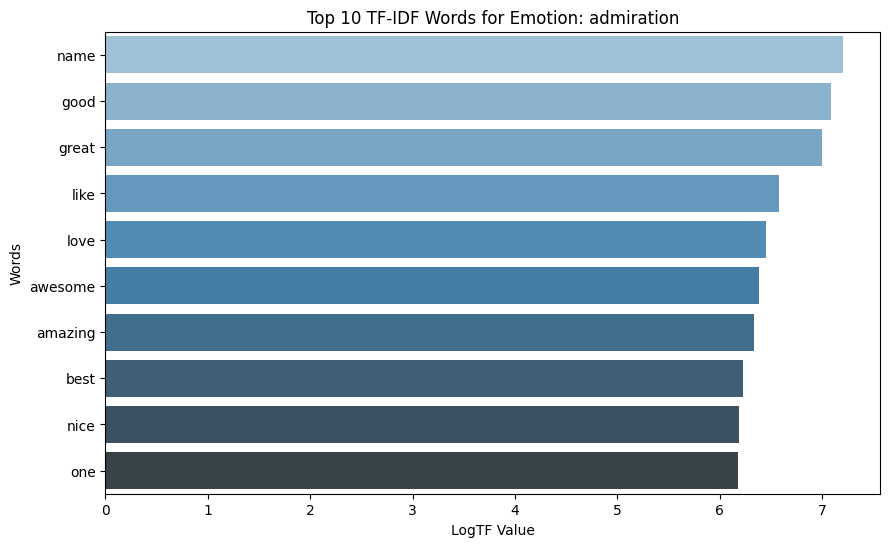

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


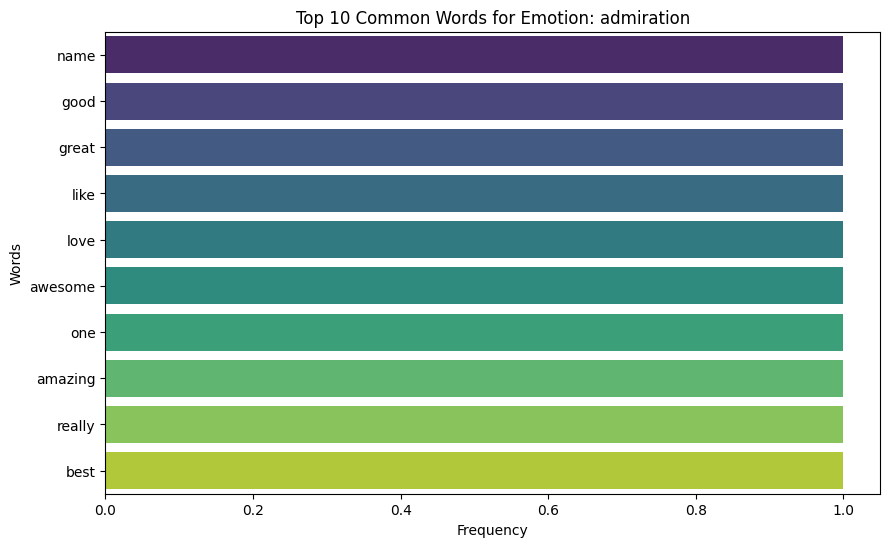

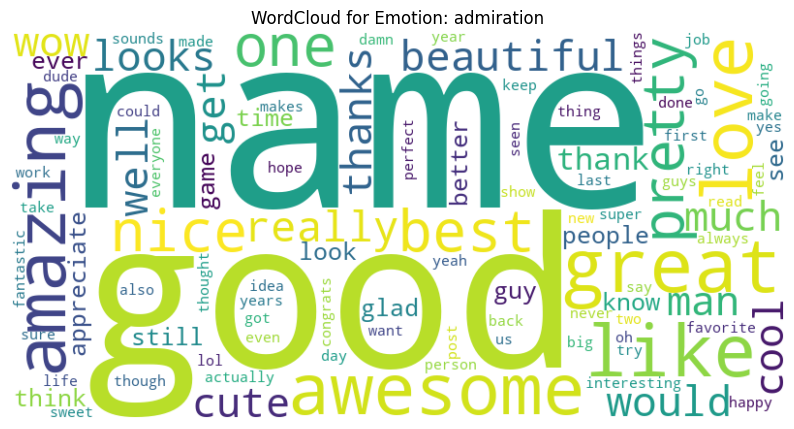

Generating plots for amusement...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


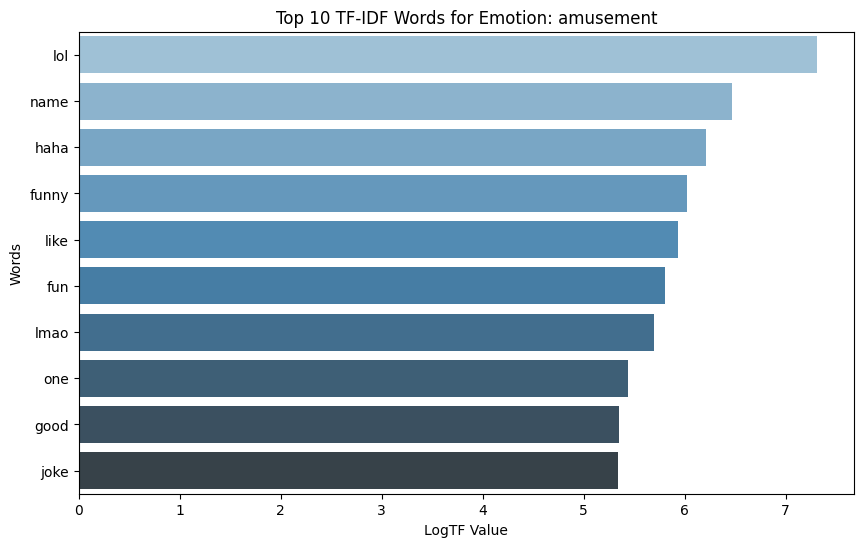

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


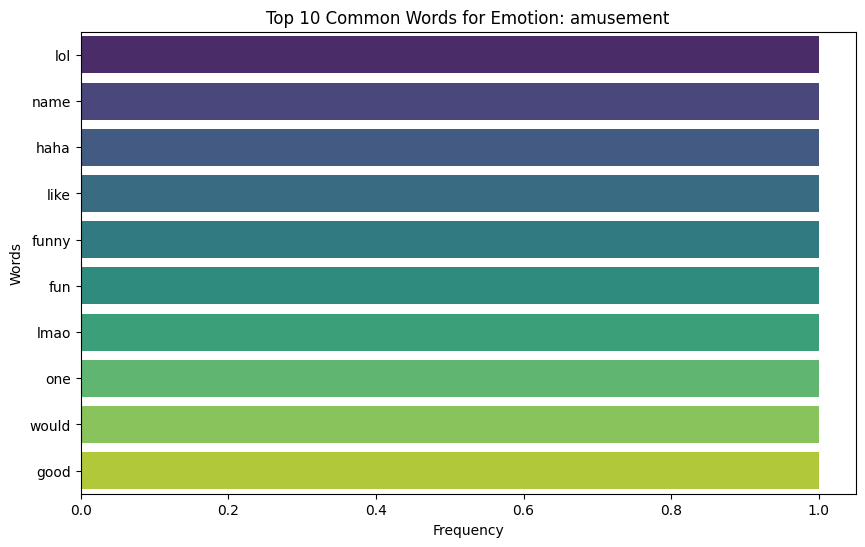

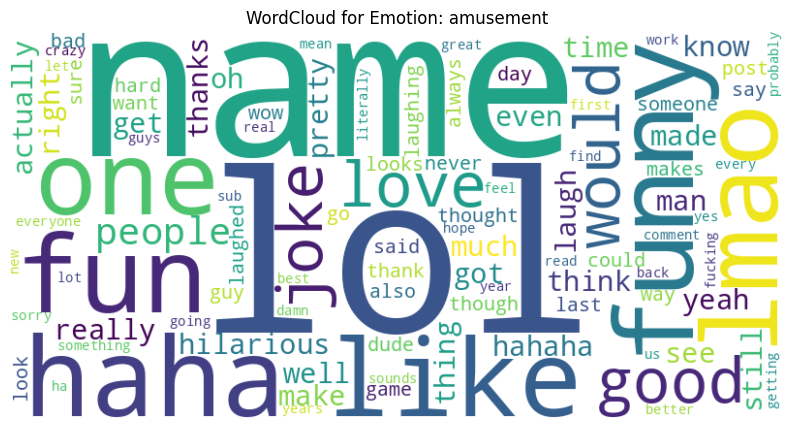

Generating plots for anger...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


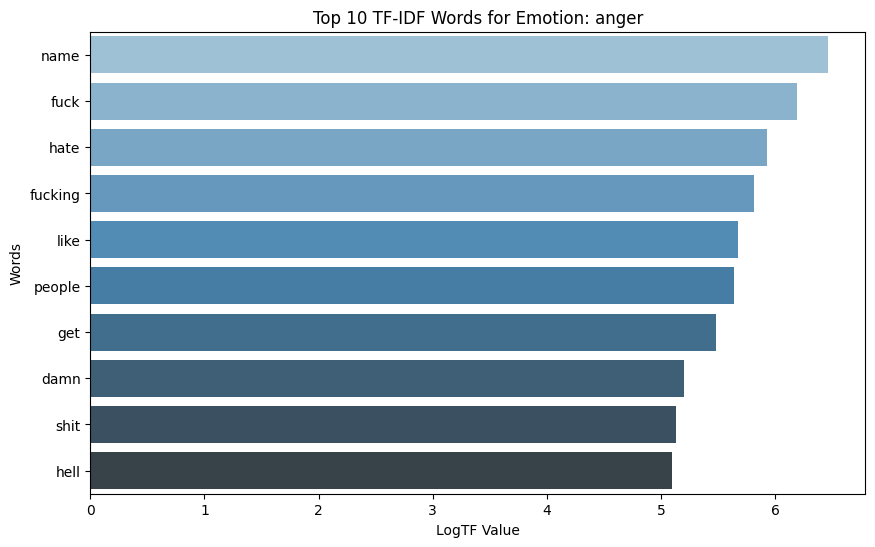

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


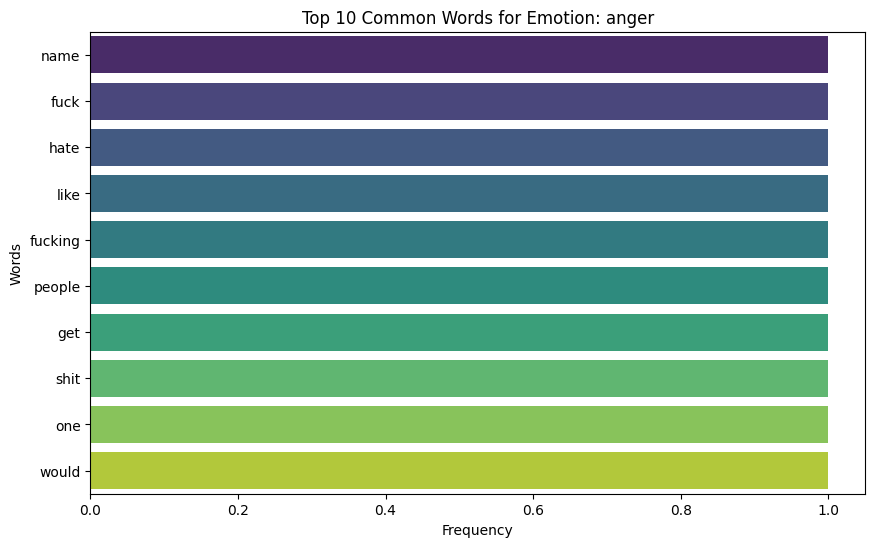

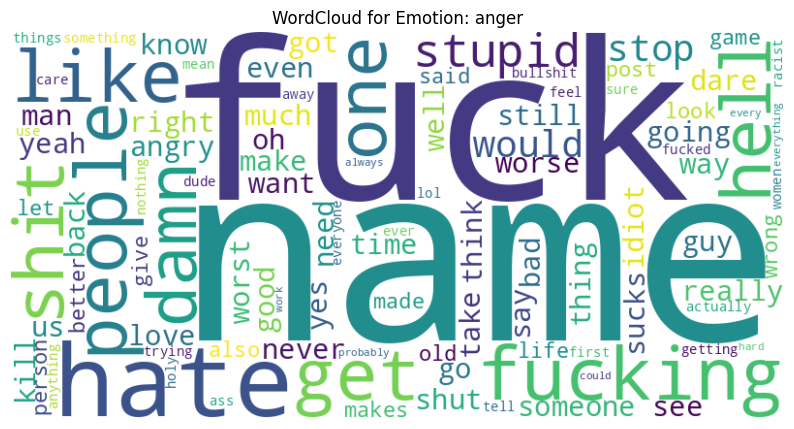

Generating plots for annoyance...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


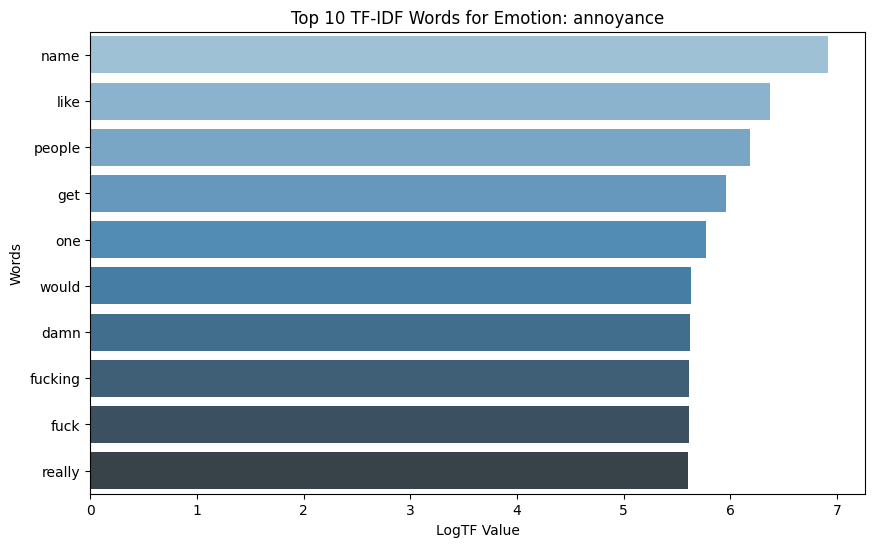

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


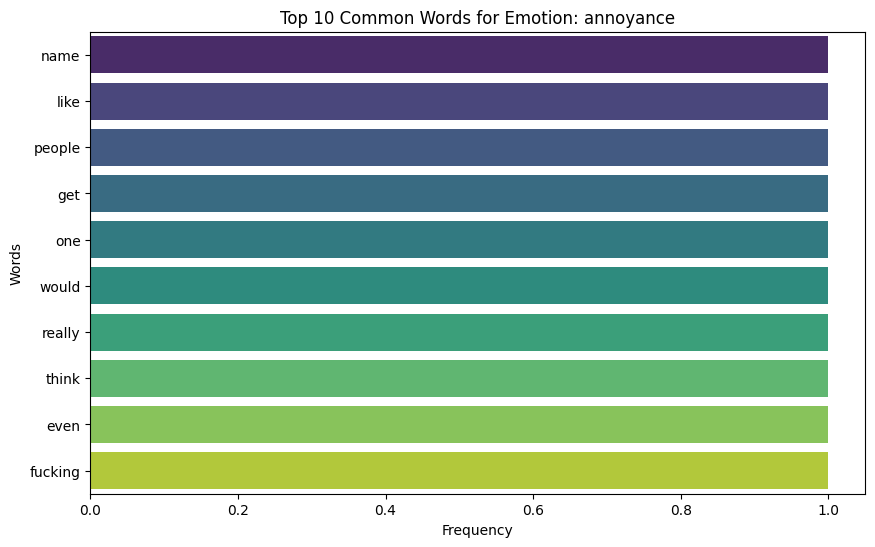

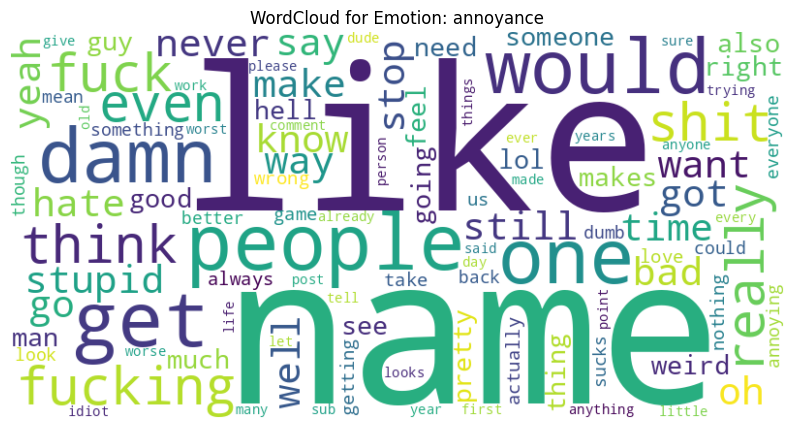

Generating plots for approval...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


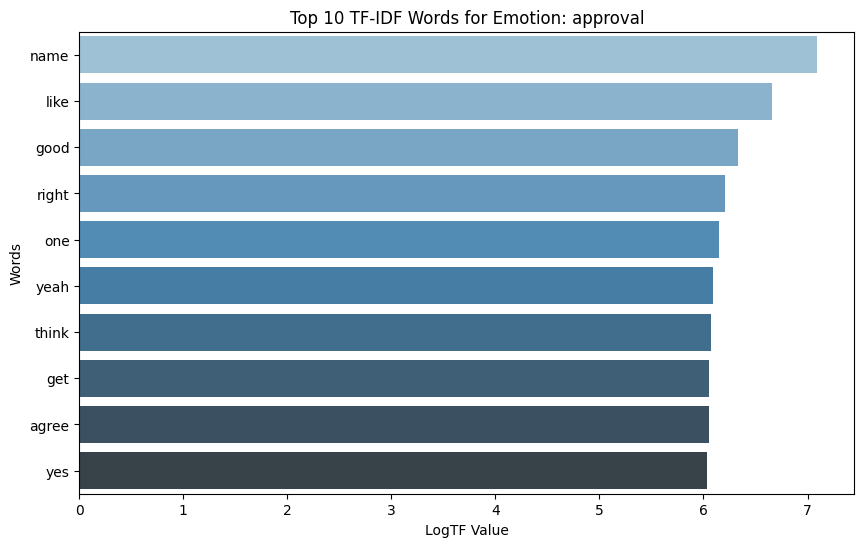

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


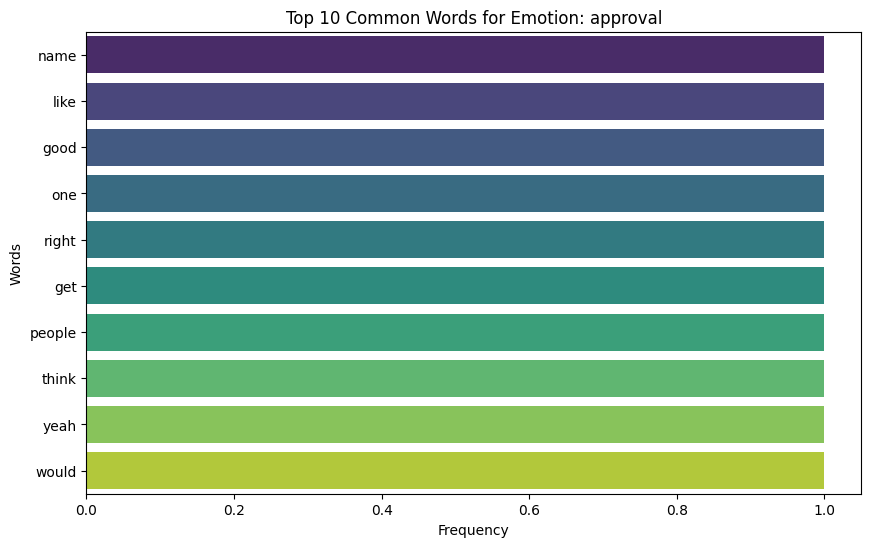

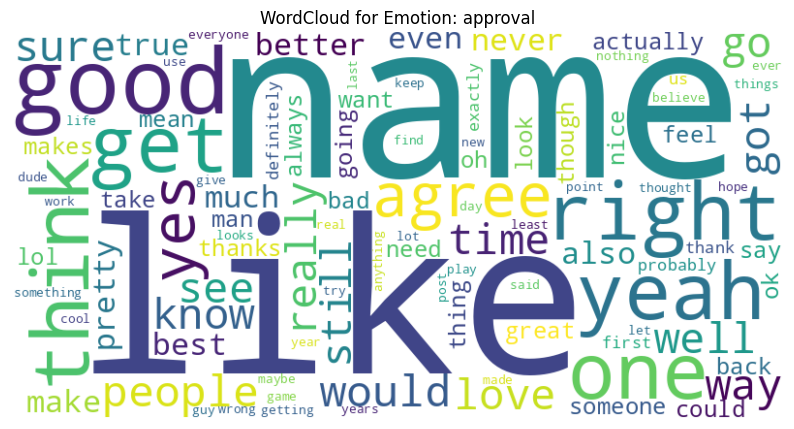

Generating plots for caring...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


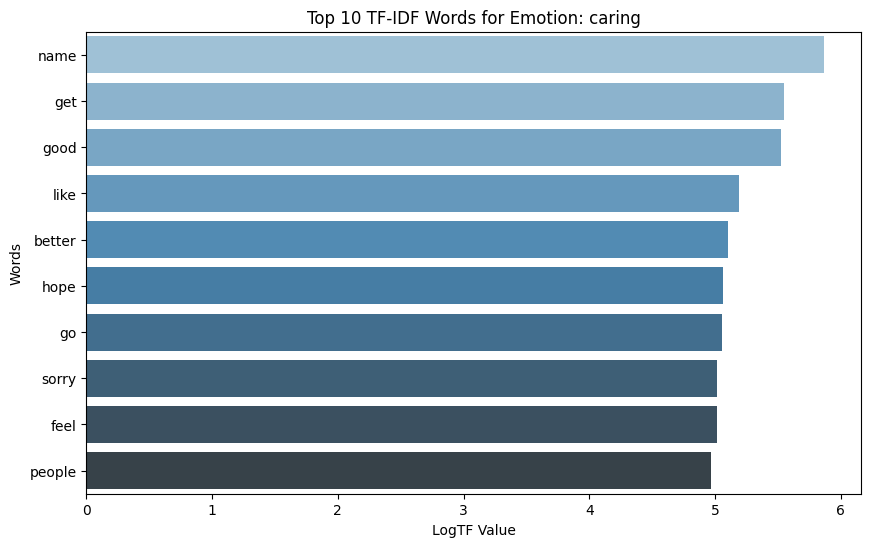

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


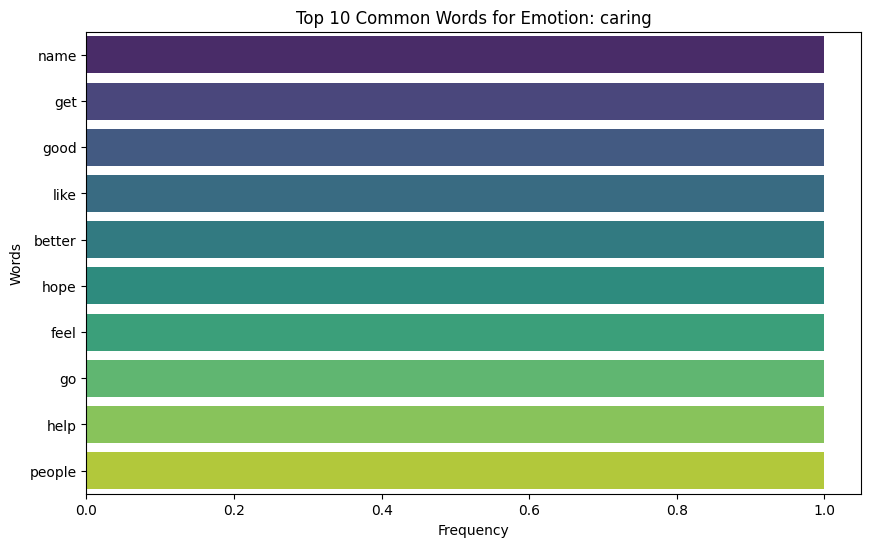

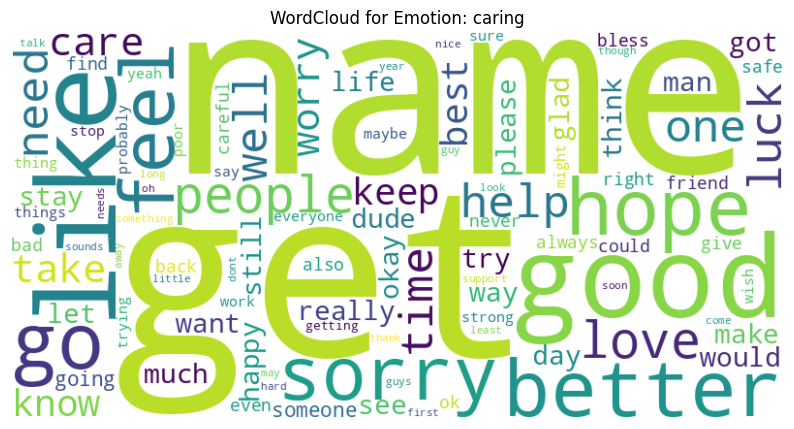

Generating plots for confusion...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


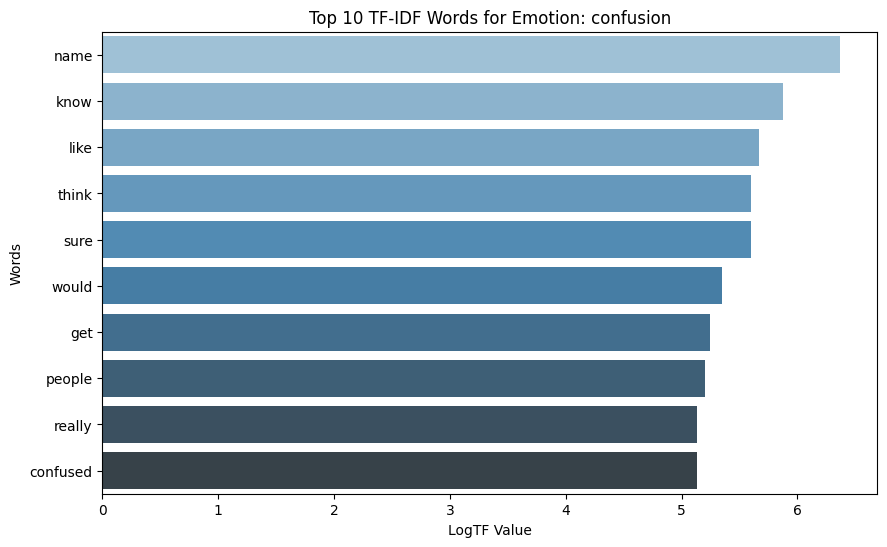

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


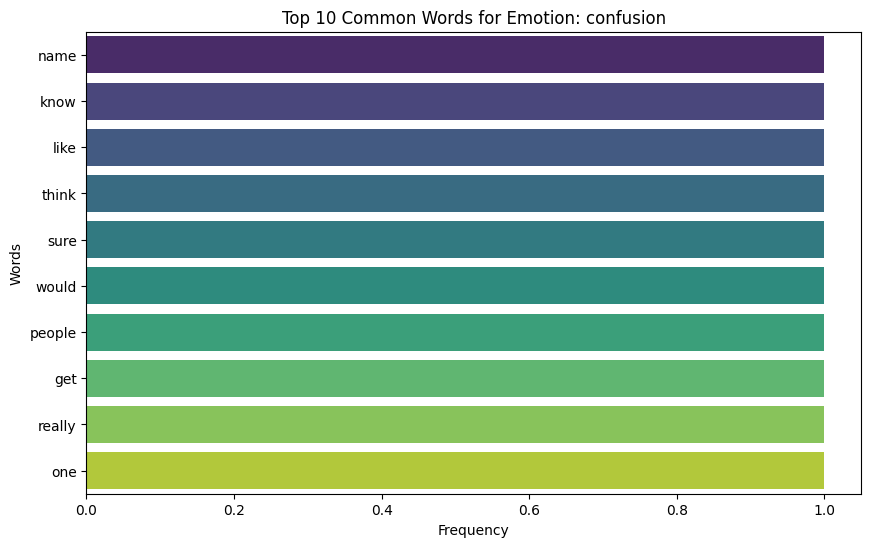

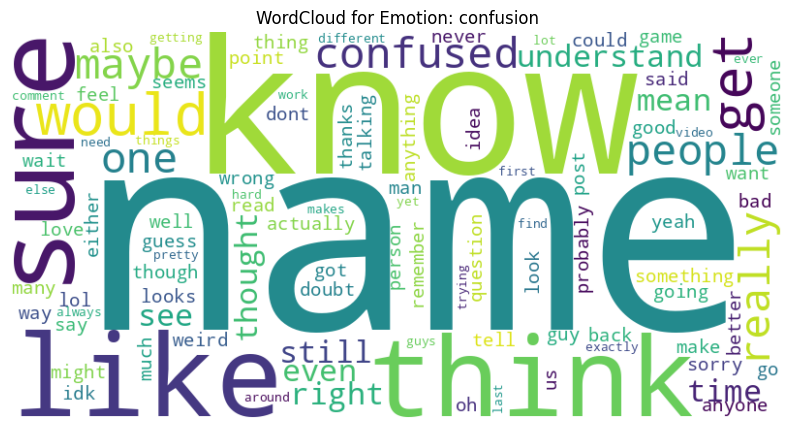

Generating plots for curiosity...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


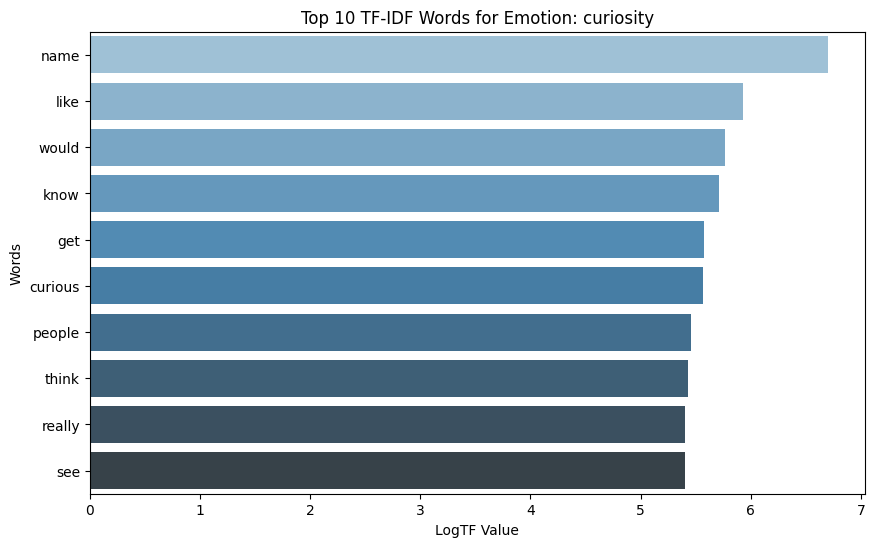

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


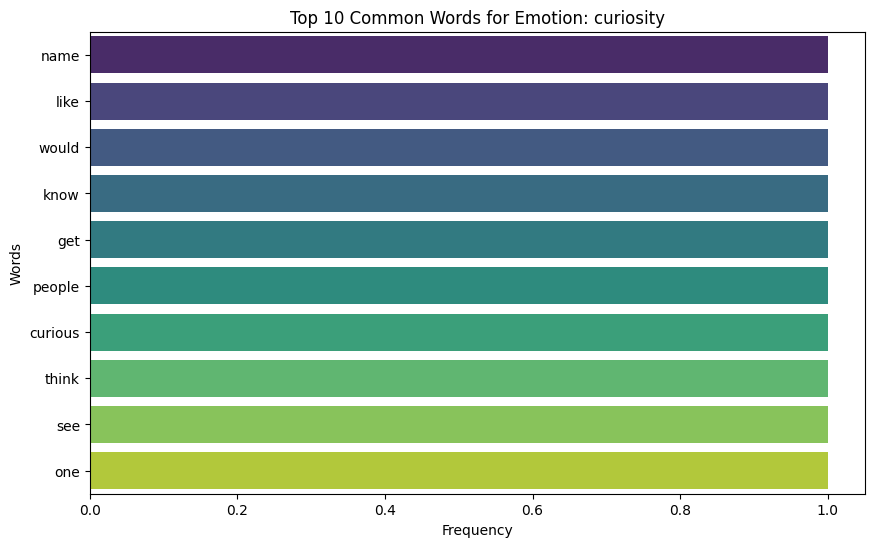

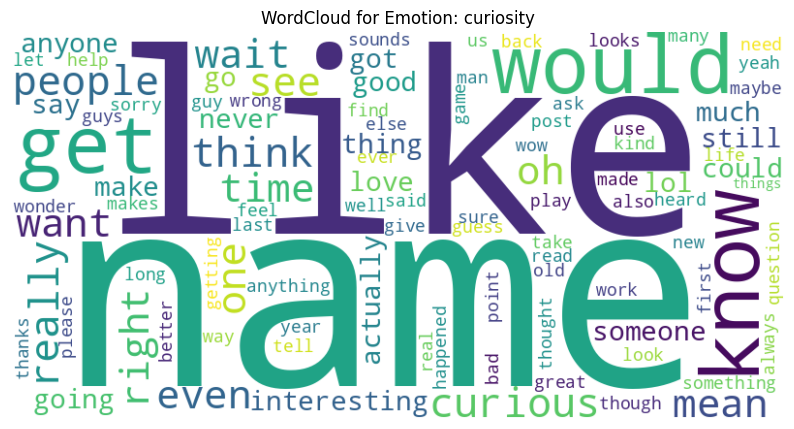

Generating plots for desire...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


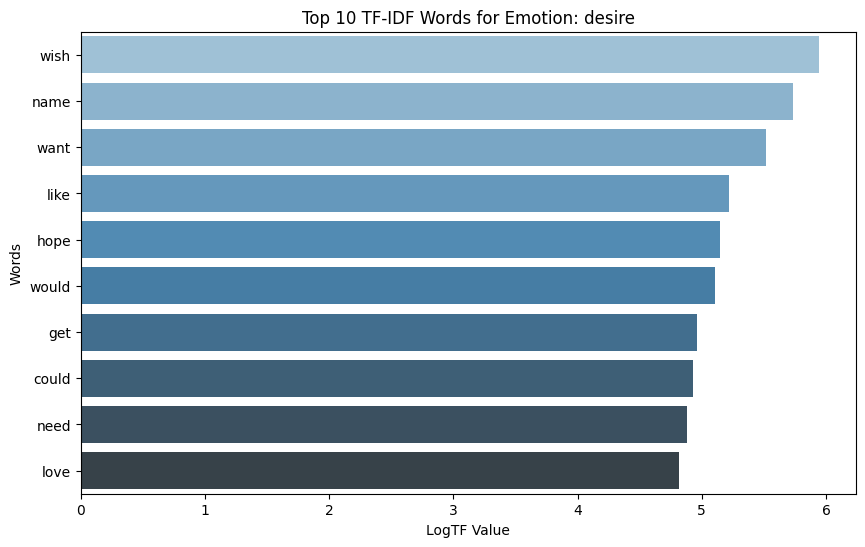

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


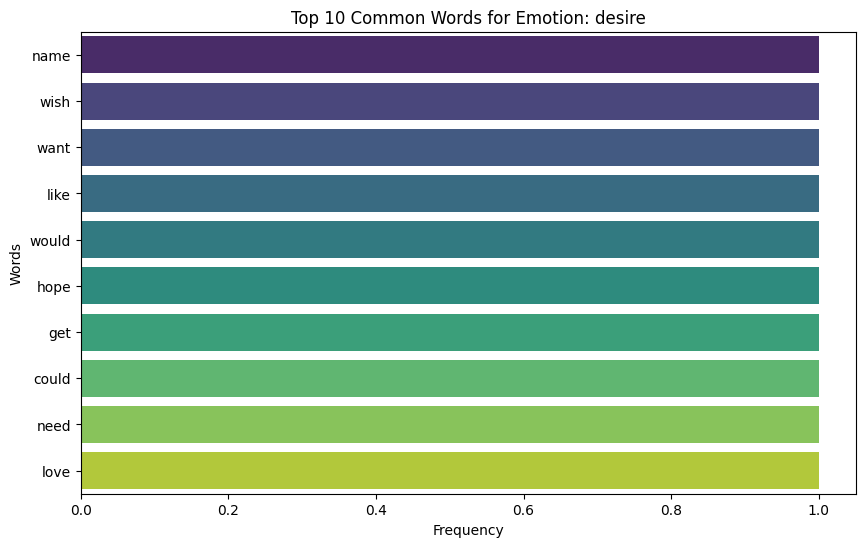

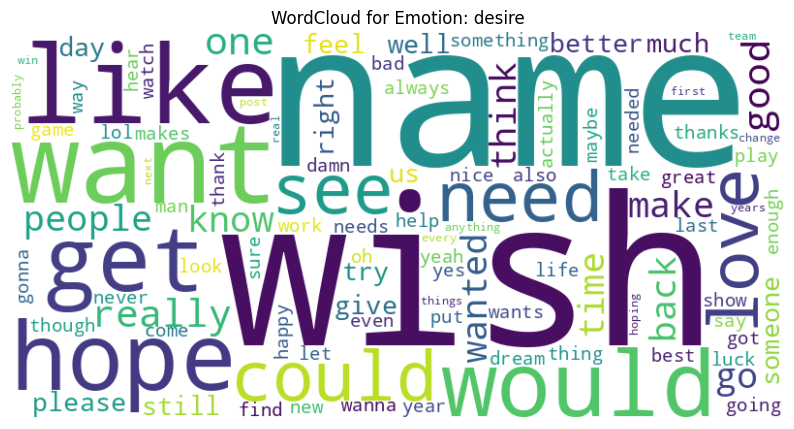

Generating plots for disappointment...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


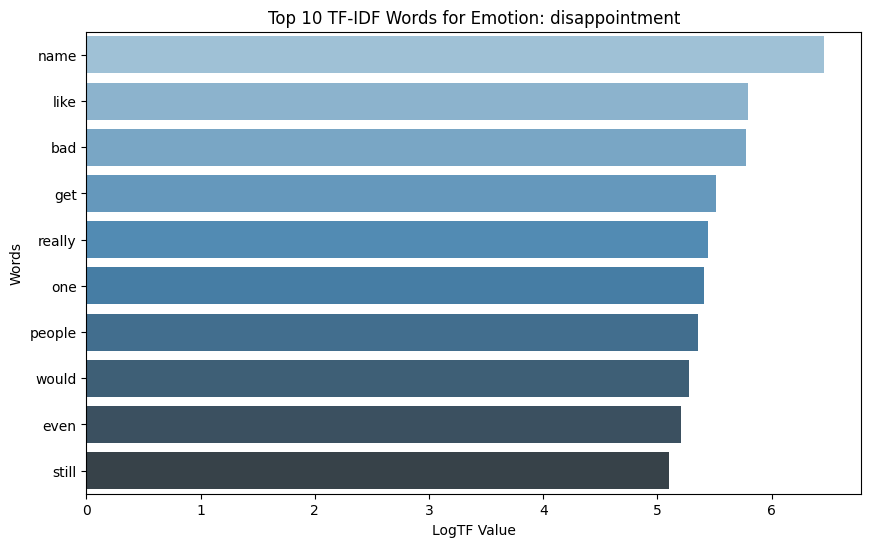

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


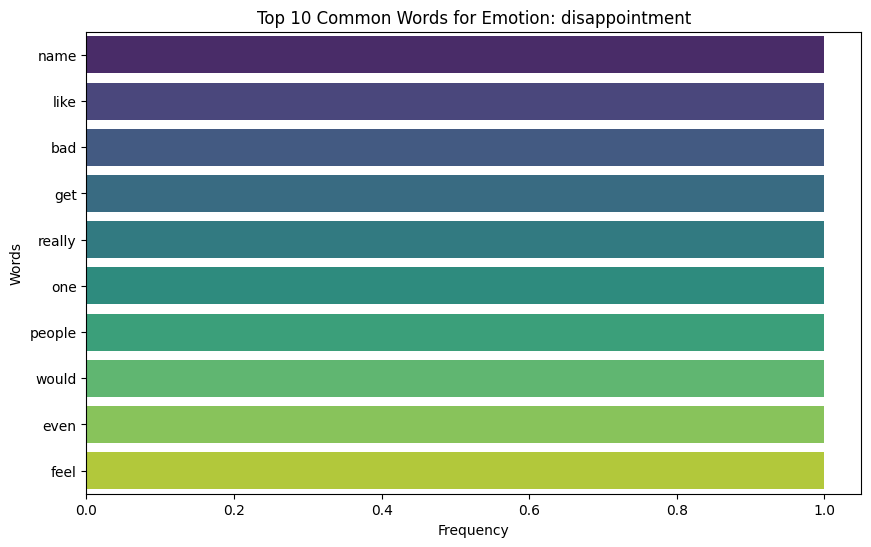

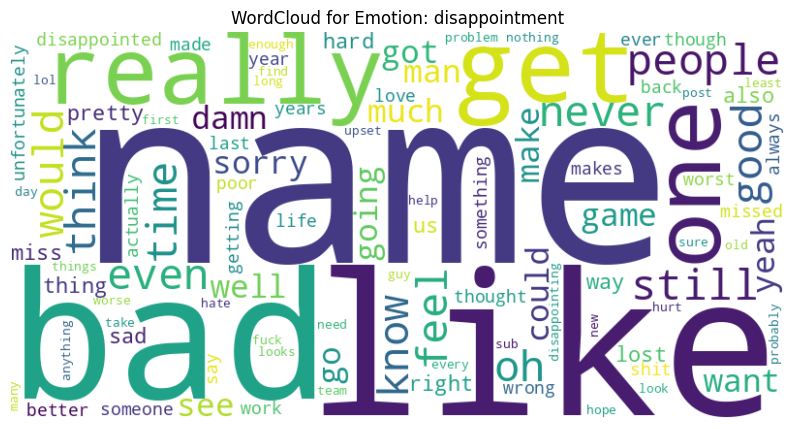

Generating plots for disapproval...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


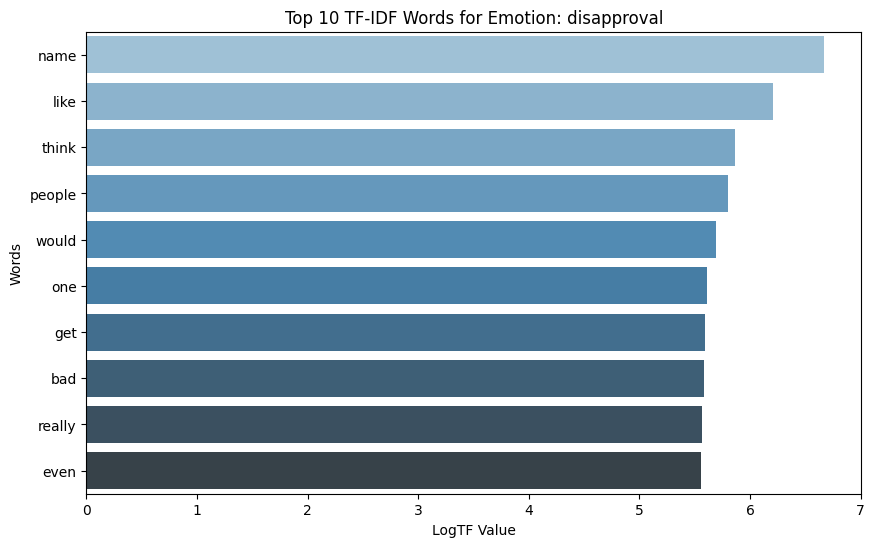

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


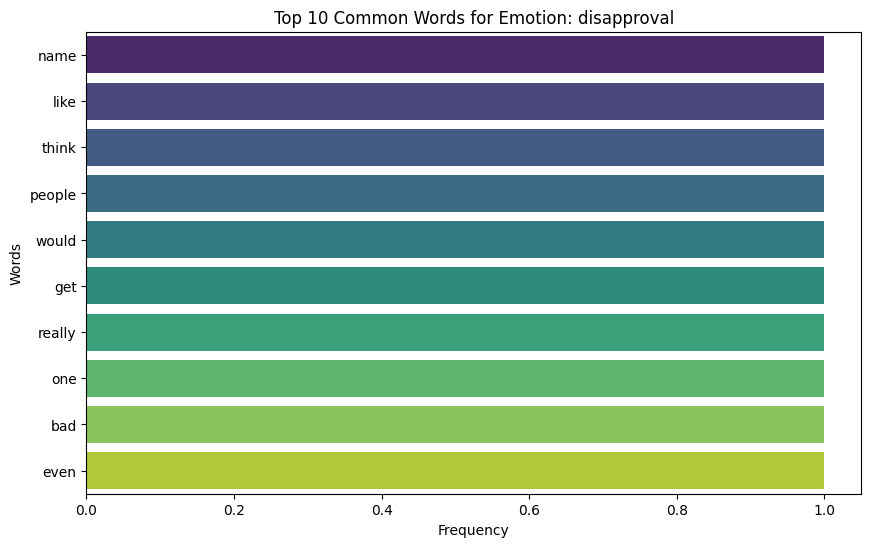

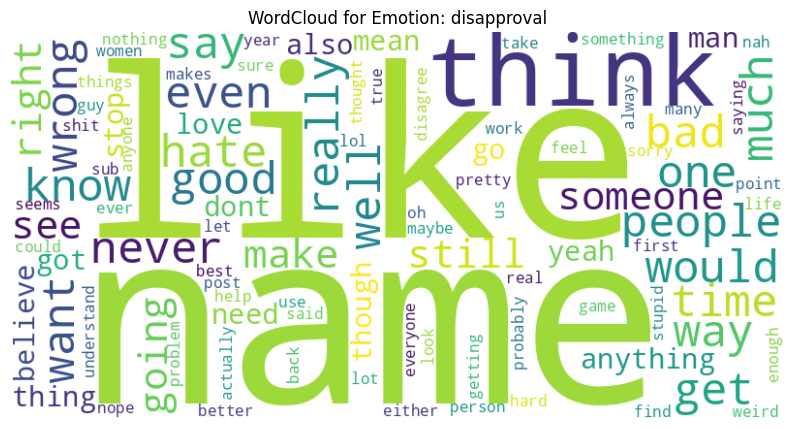

Generating plots for disgust...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


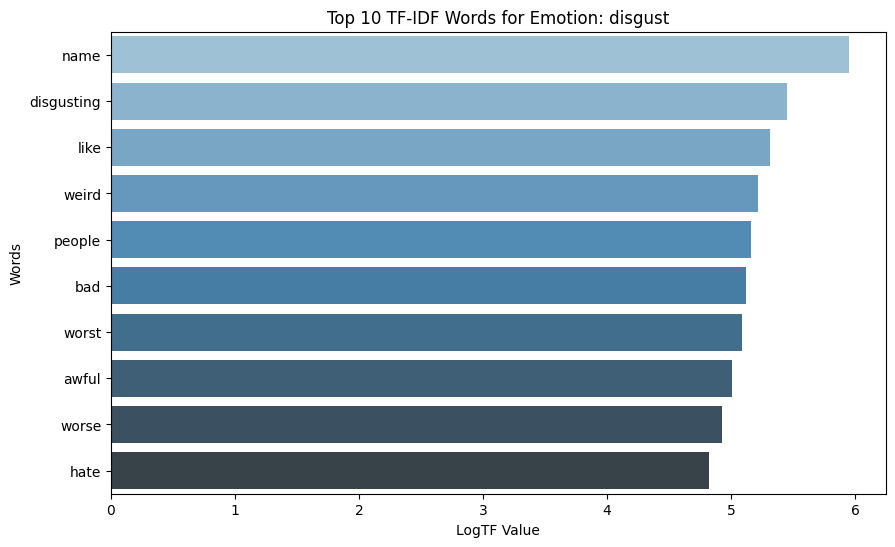

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


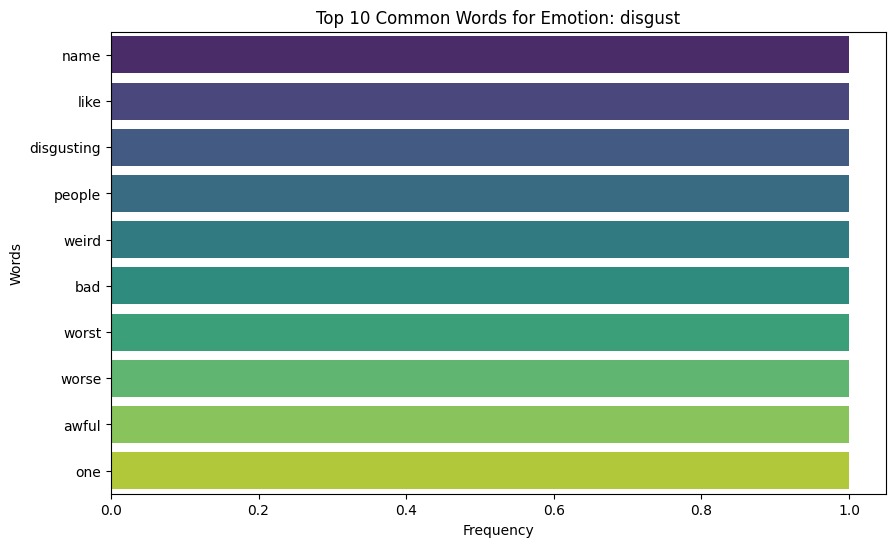

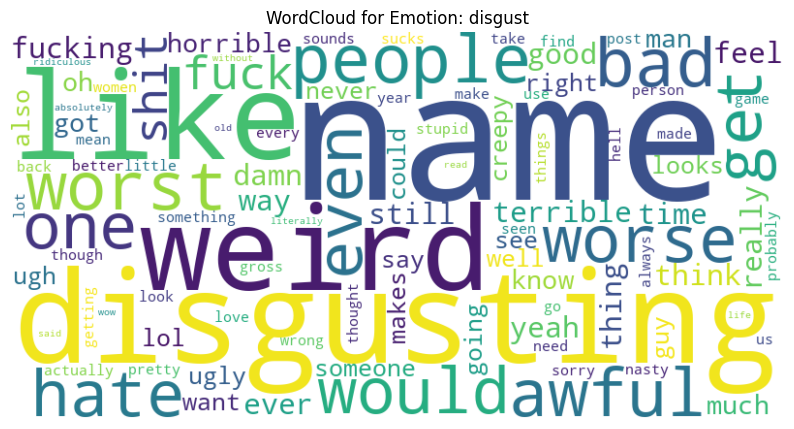

Generating plots for embarrassment...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


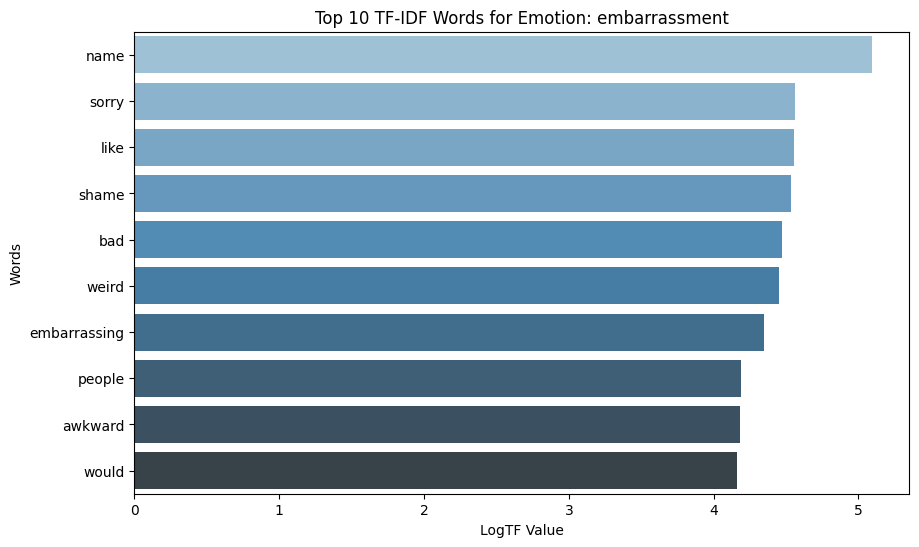

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


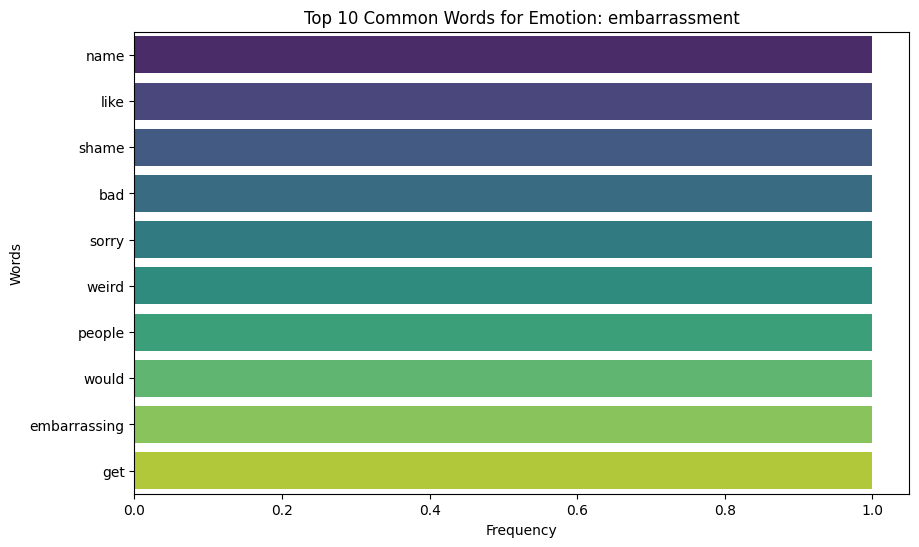

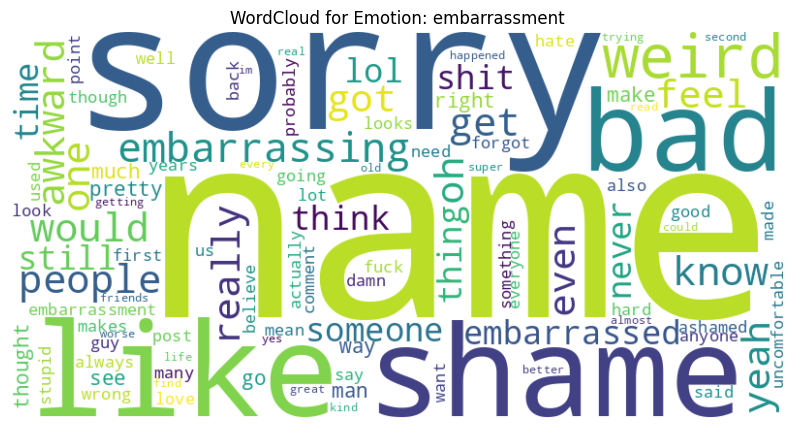

Generating plots for excitement...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


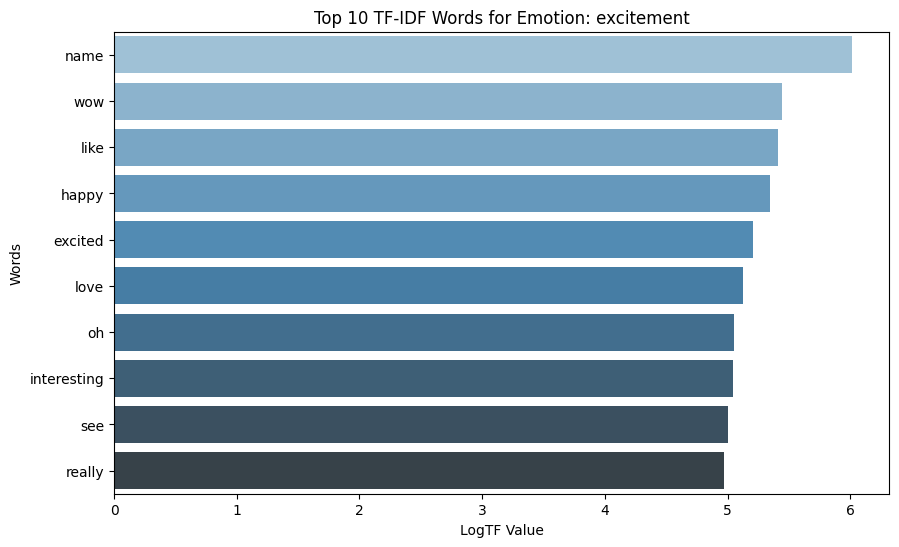

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


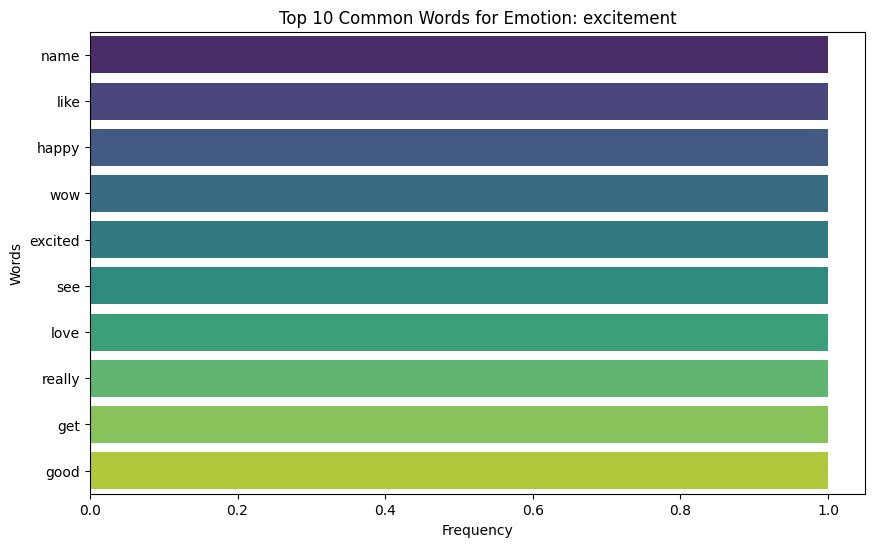

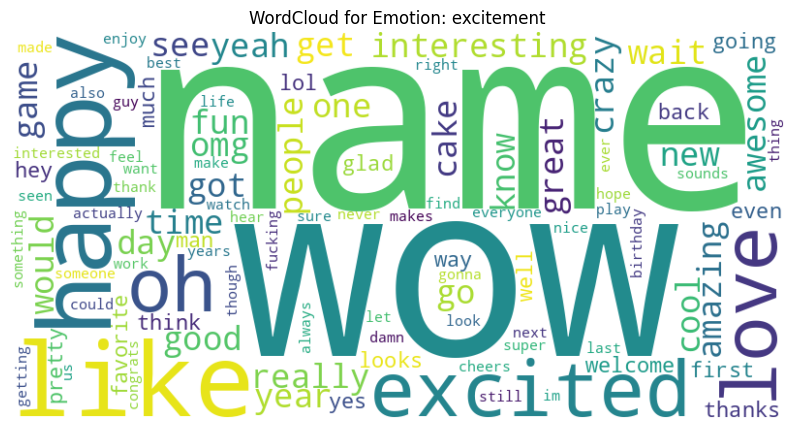

Generating plots for fear...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


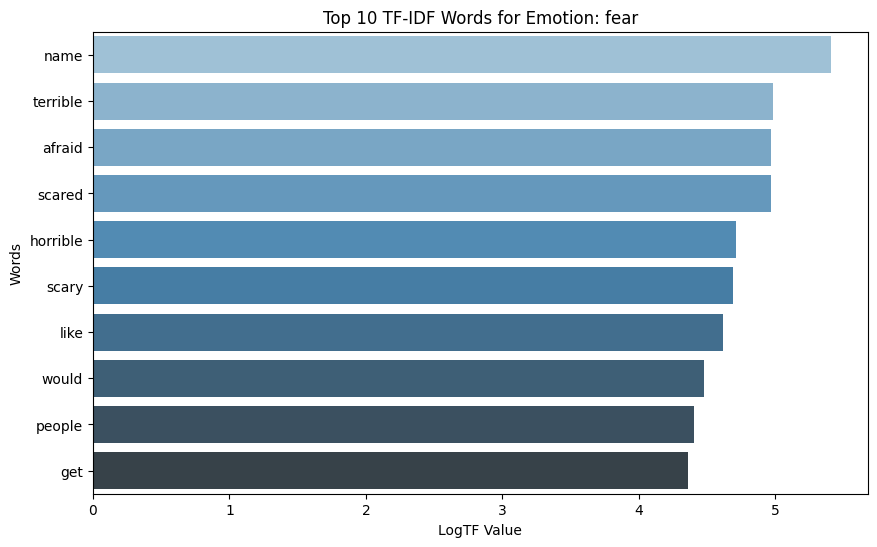

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


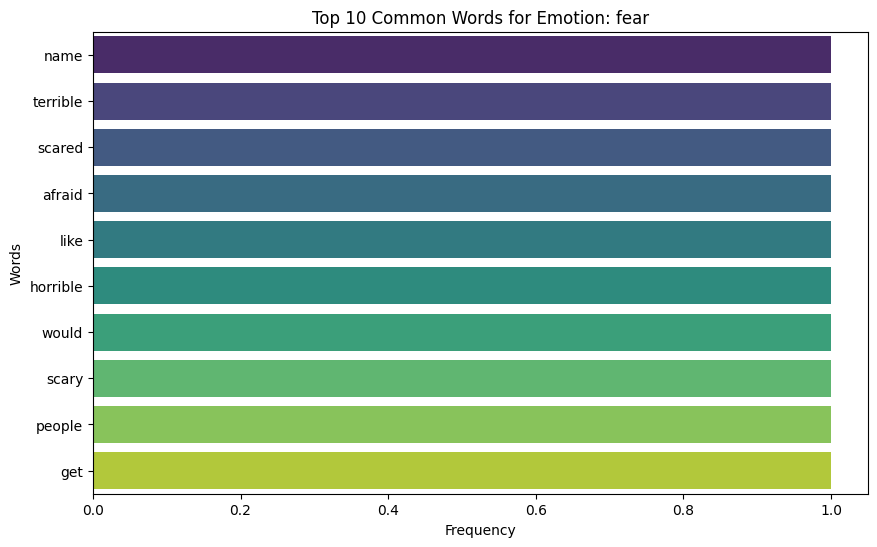

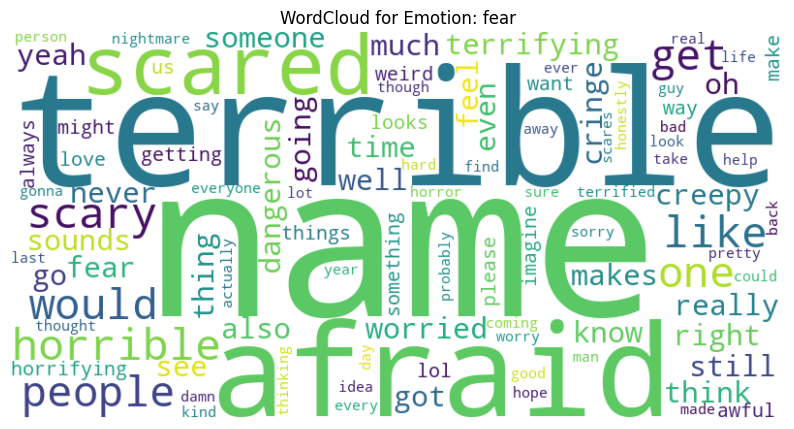

Generating plots for gratitude...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


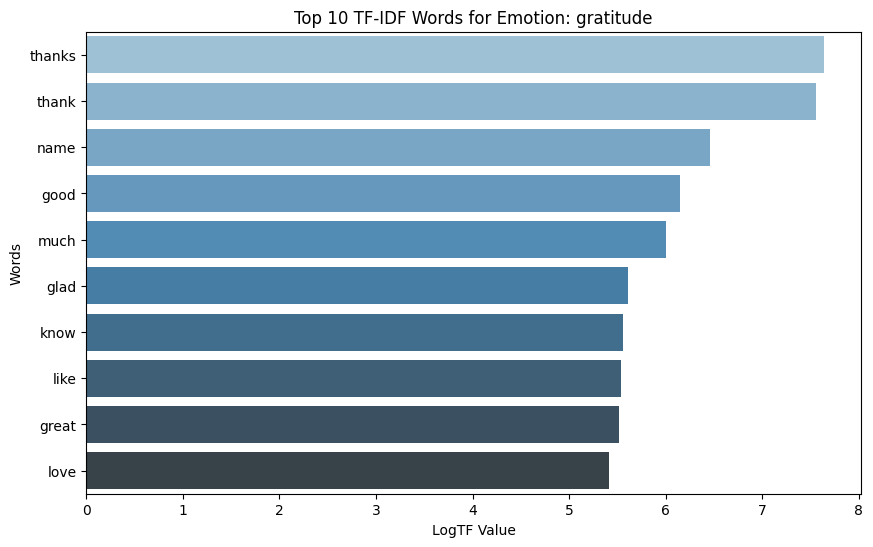

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


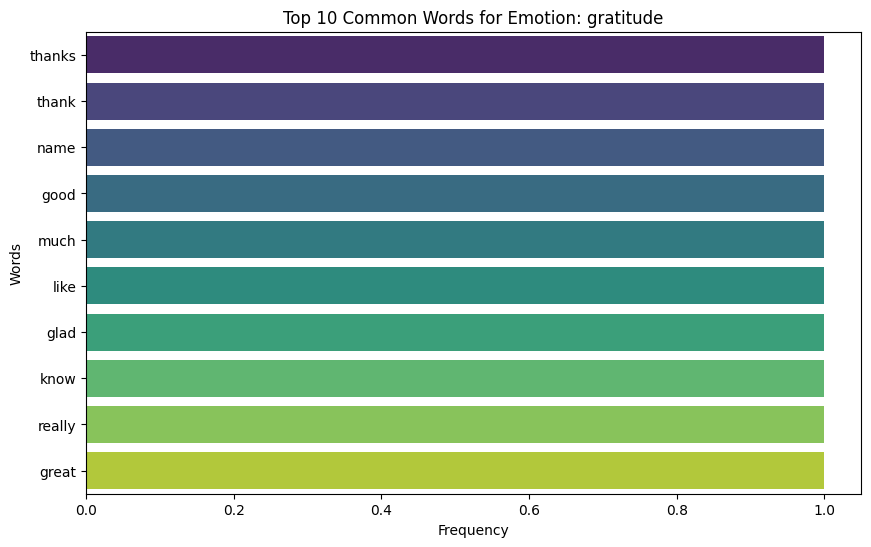

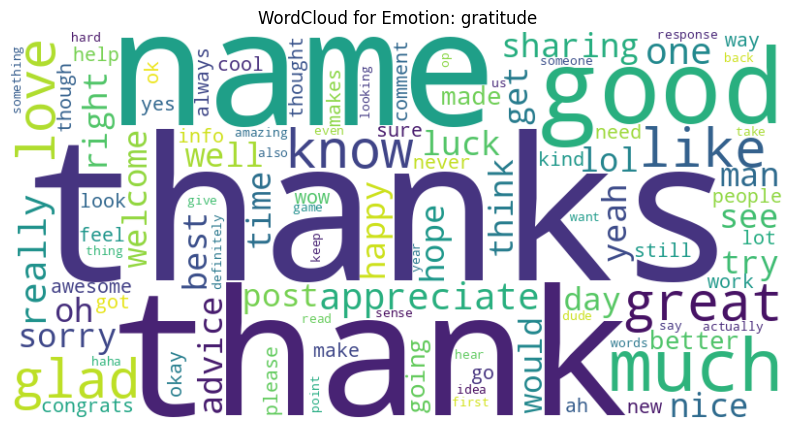

Generating plots for grief...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


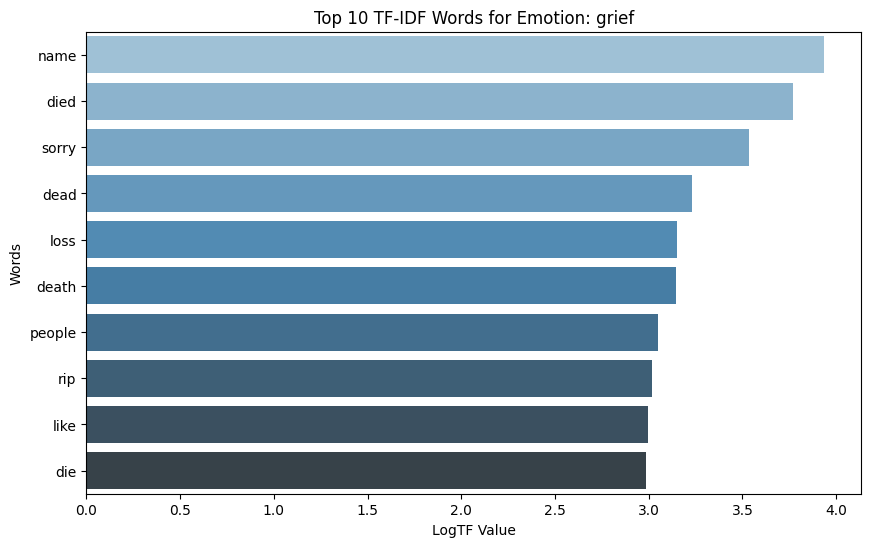

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


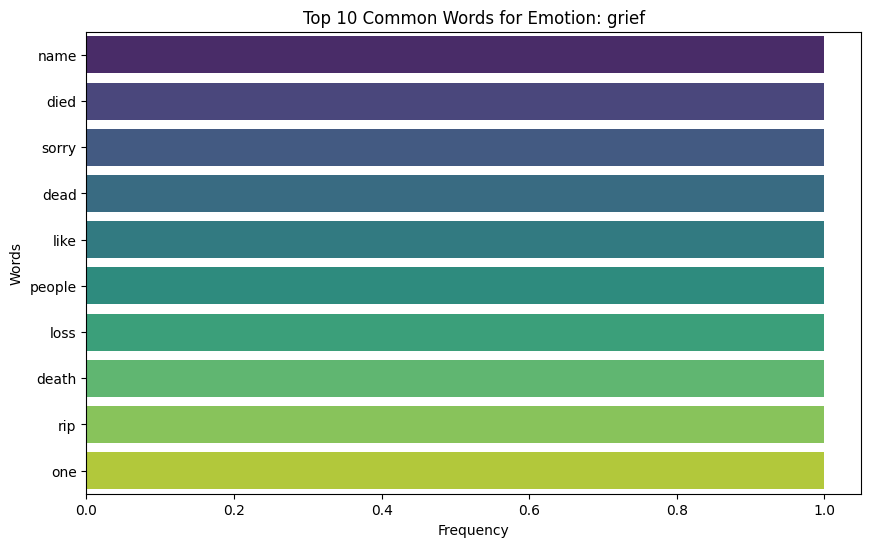

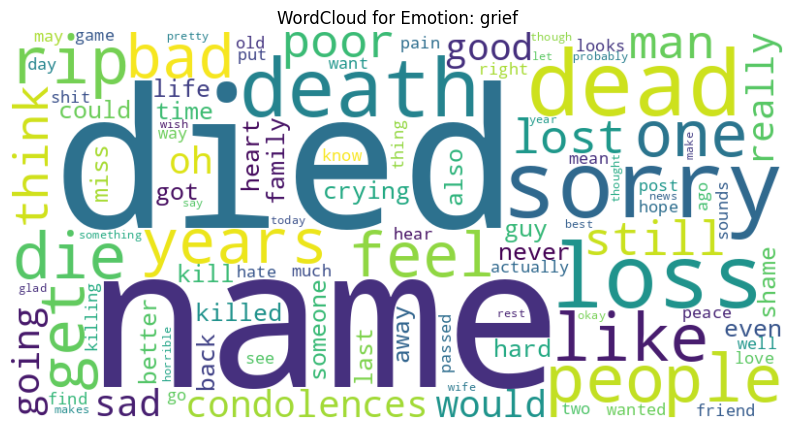

Generating plots for joy...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


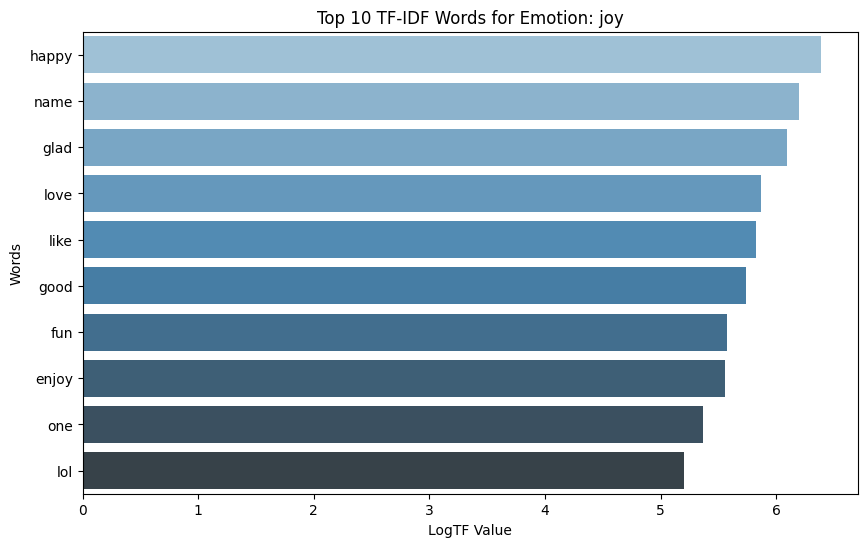

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


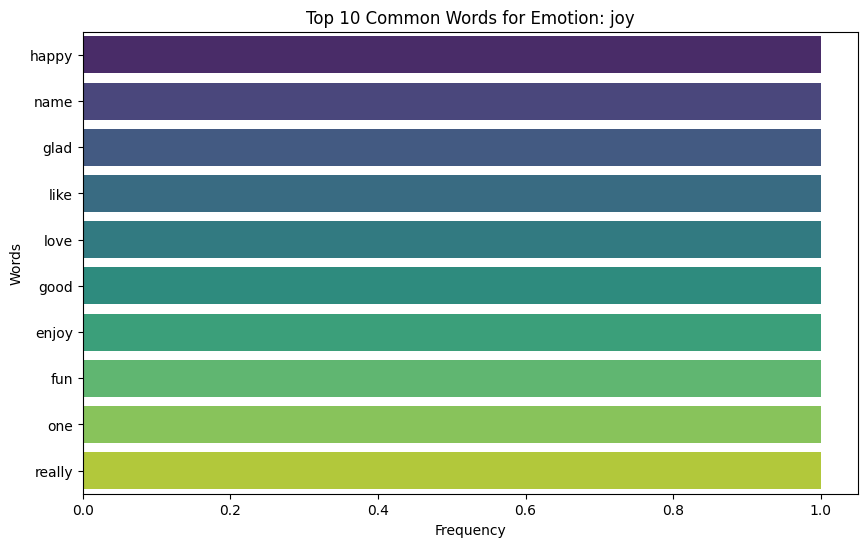

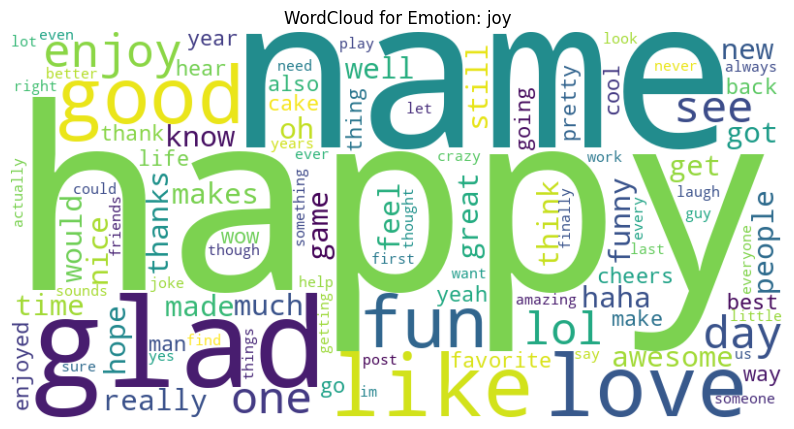

Generating plots for love...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


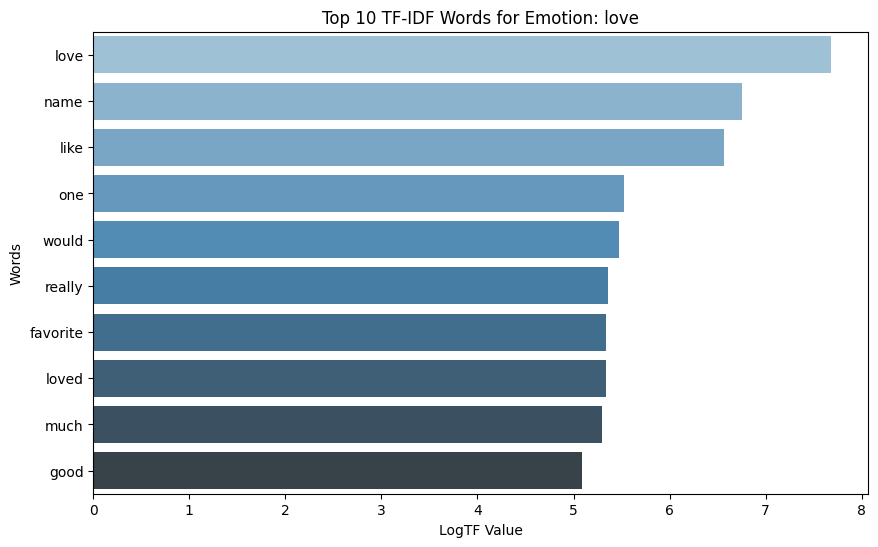

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


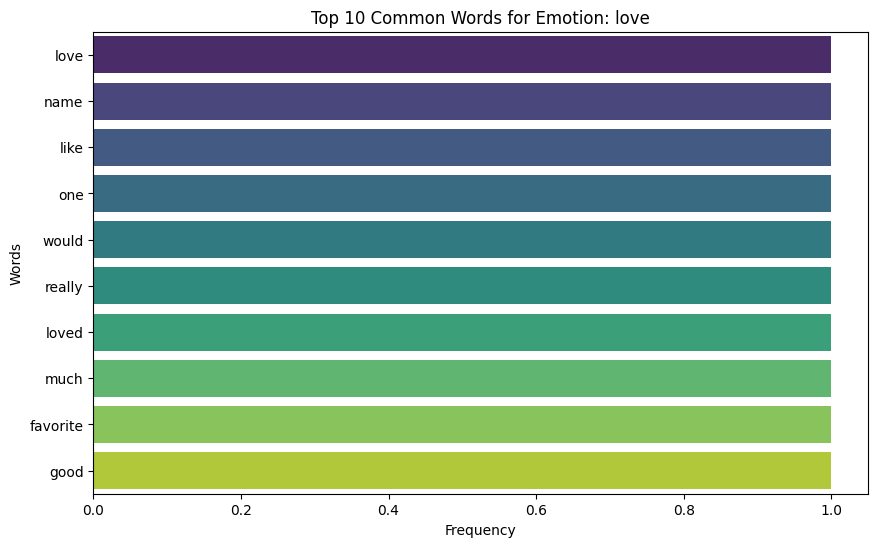

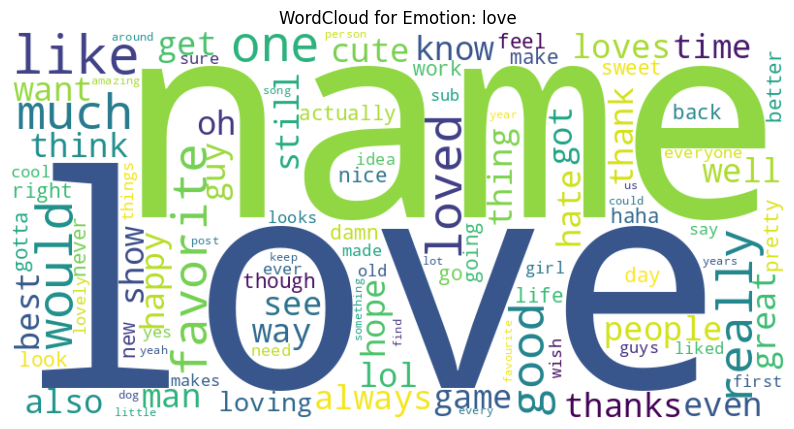

Generating plots for nervousness...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


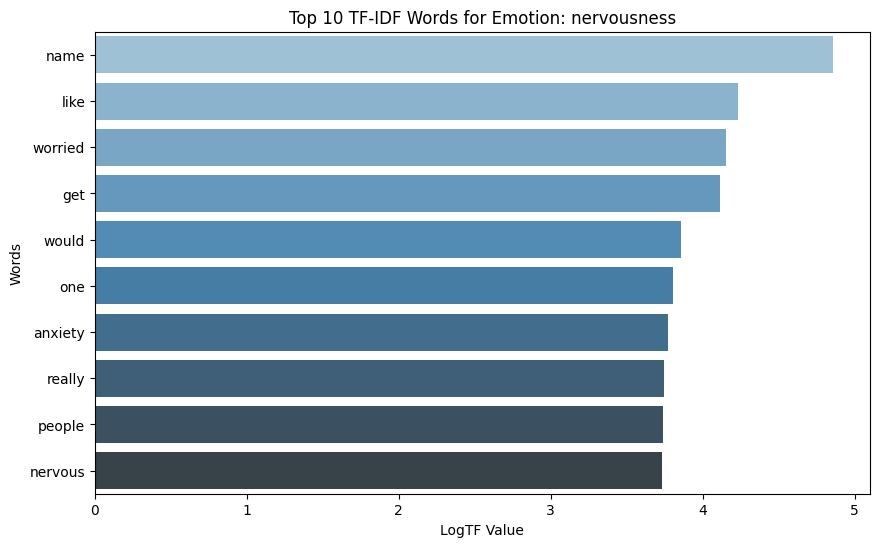

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


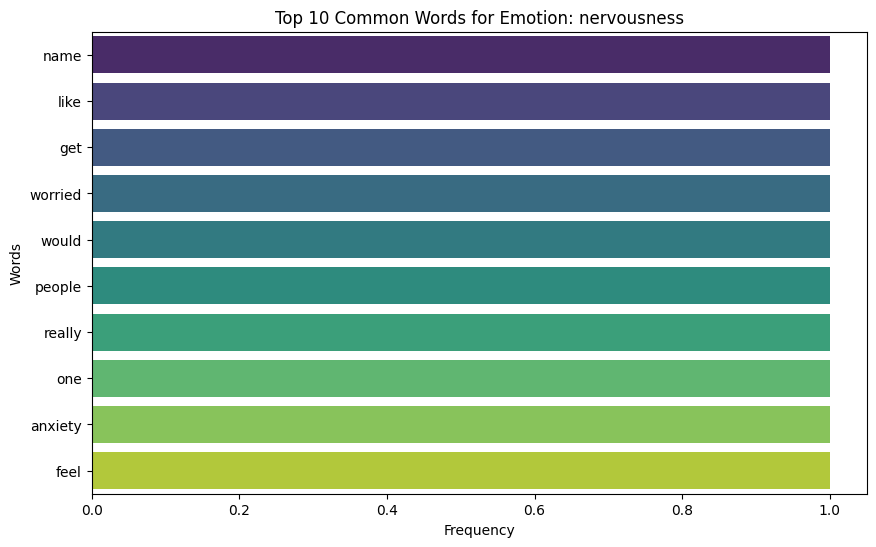

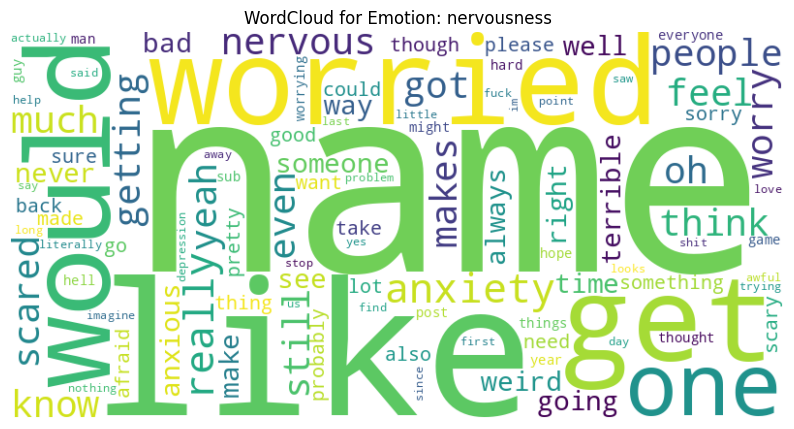

Generating plots for optimism...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


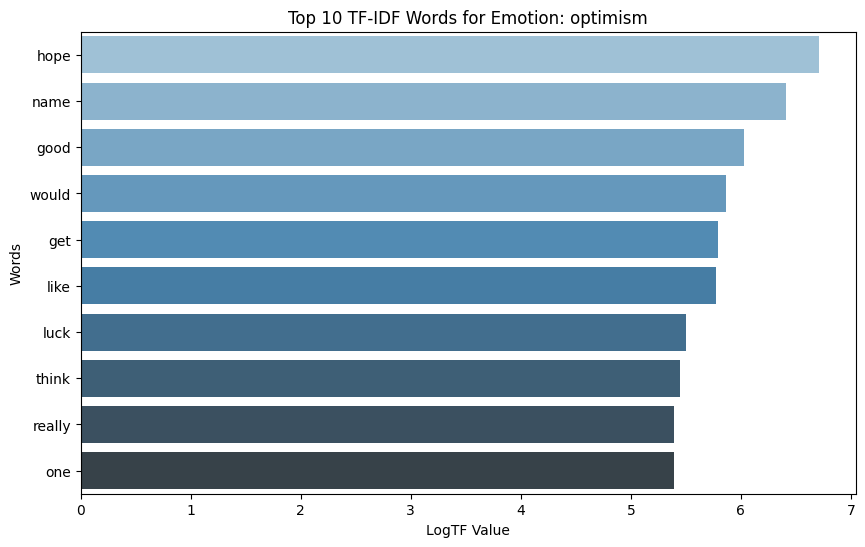

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


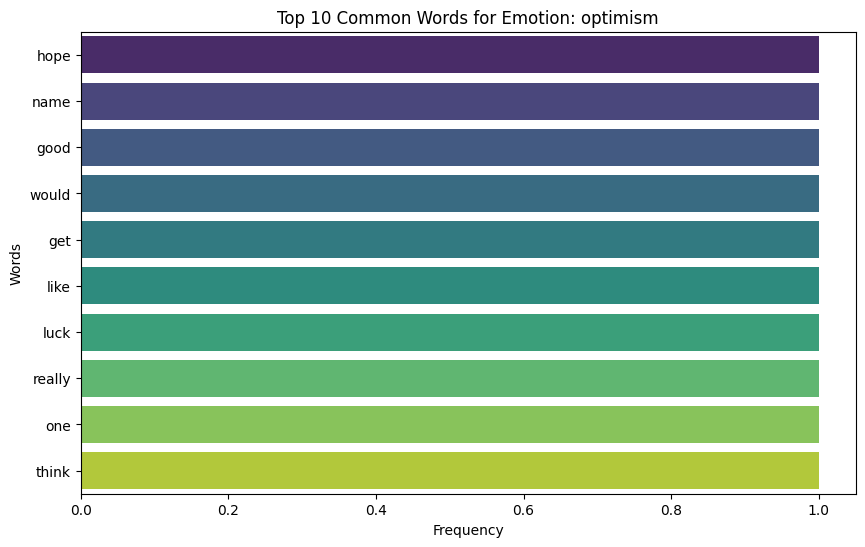

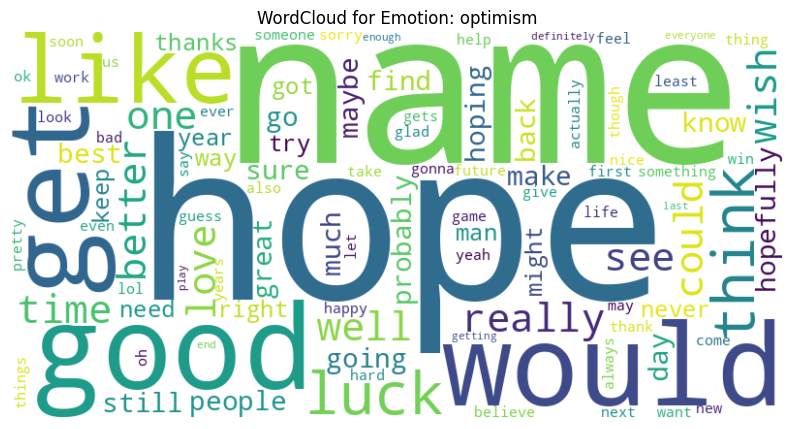

Generating plots for pride...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


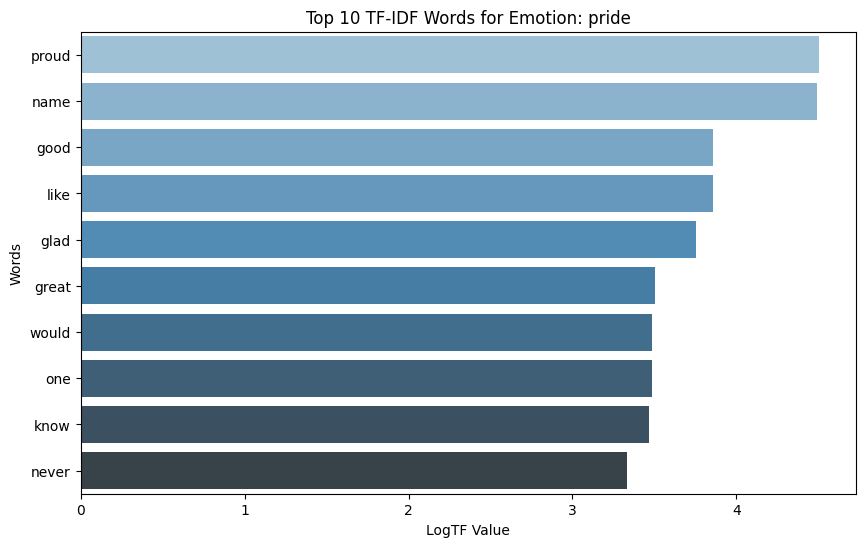

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


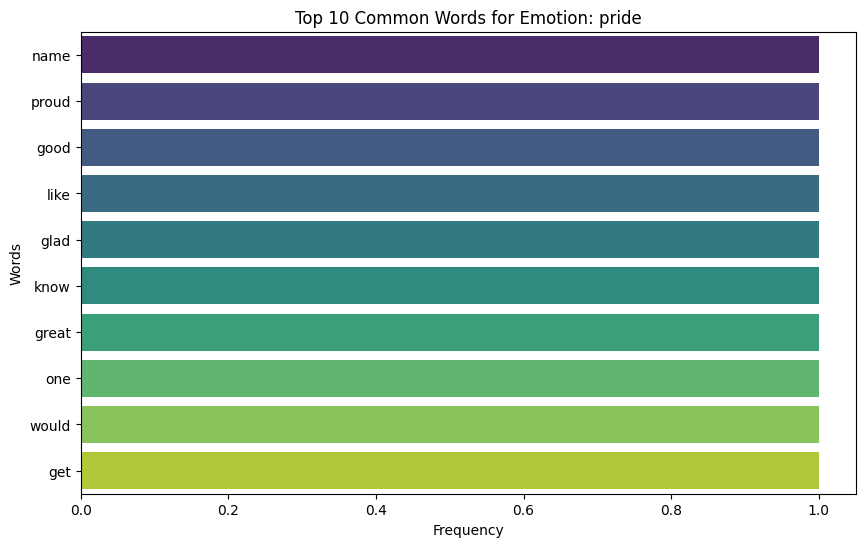

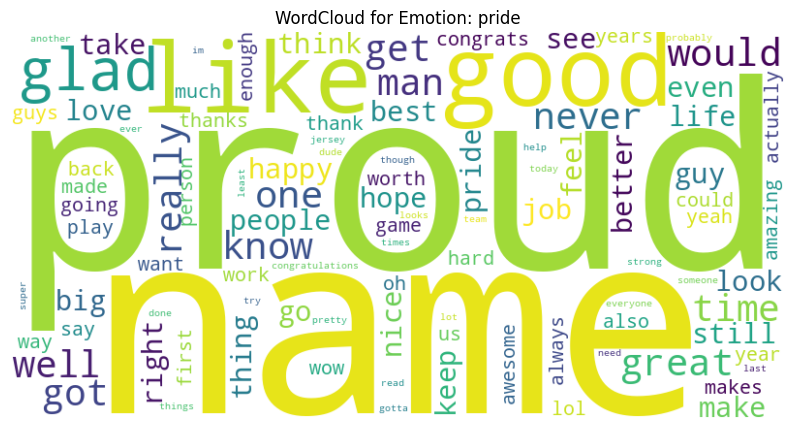

Generating plots for realization...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


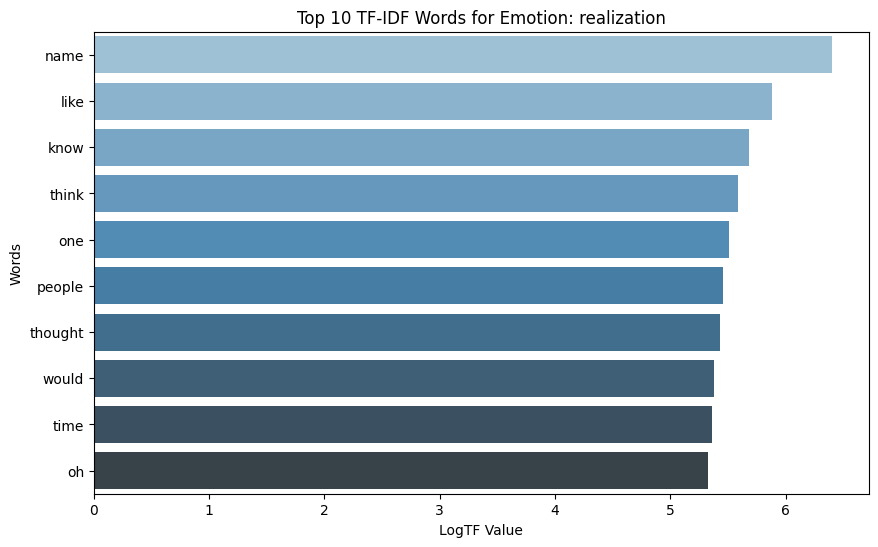

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


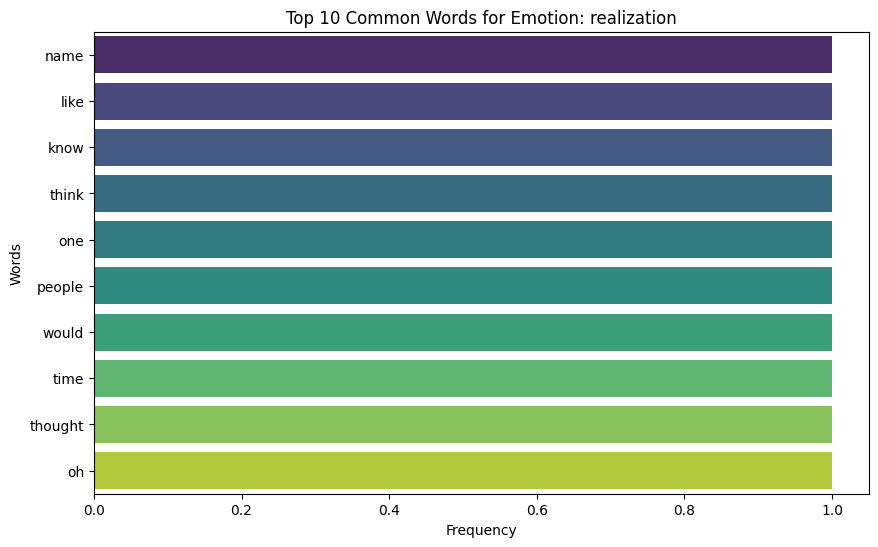

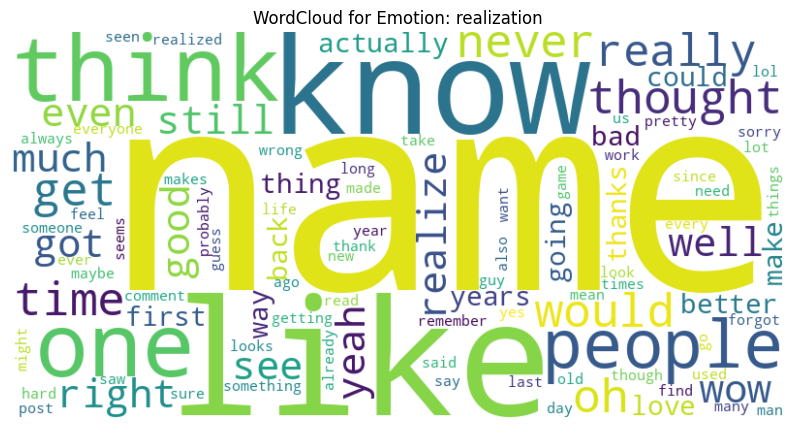

Generating plots for relief...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


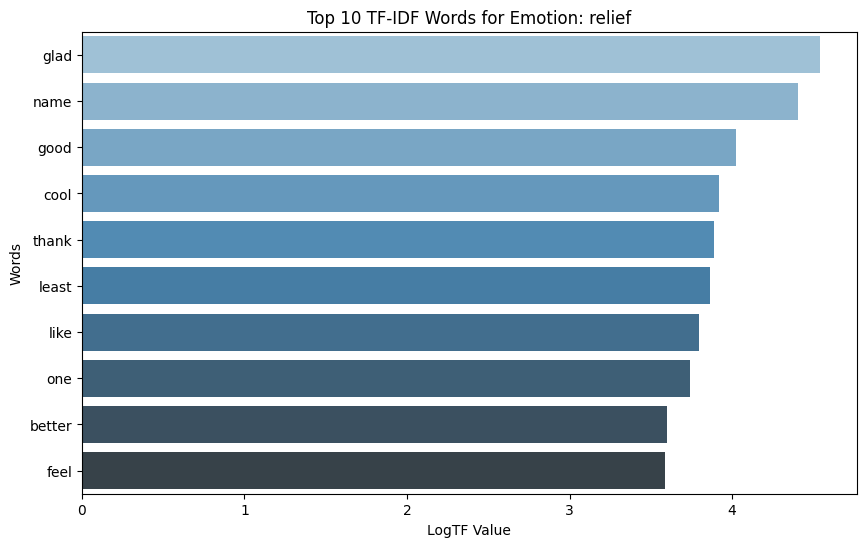

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


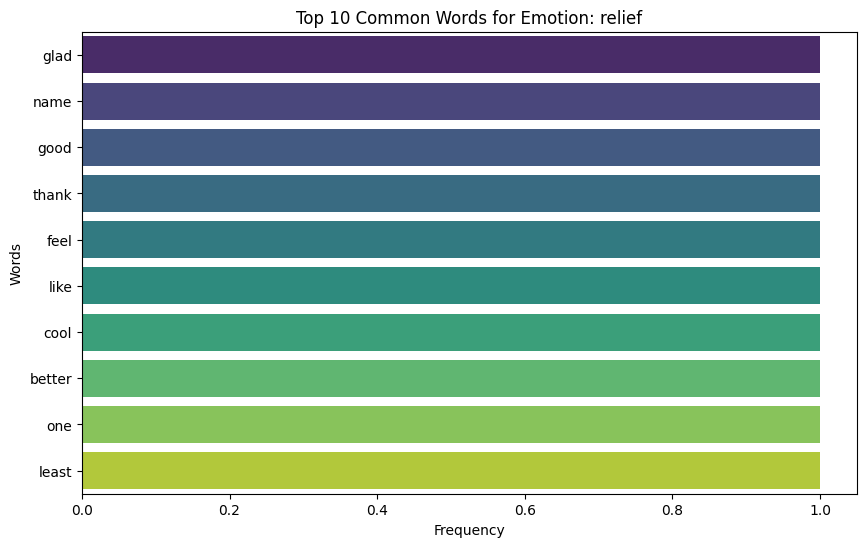

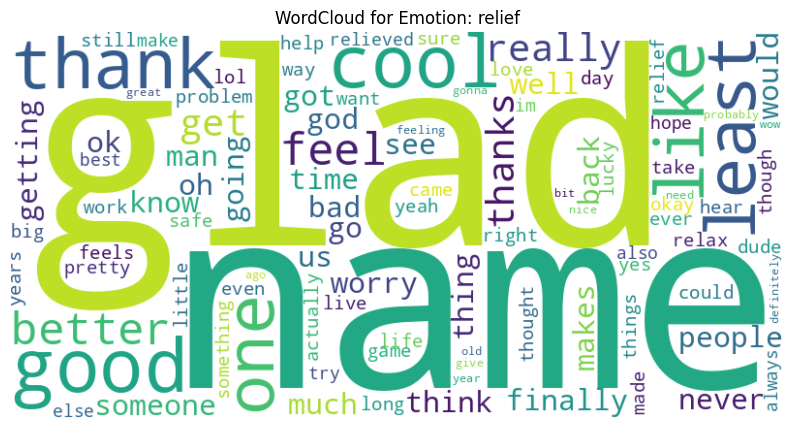

Generating plots for remorse...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


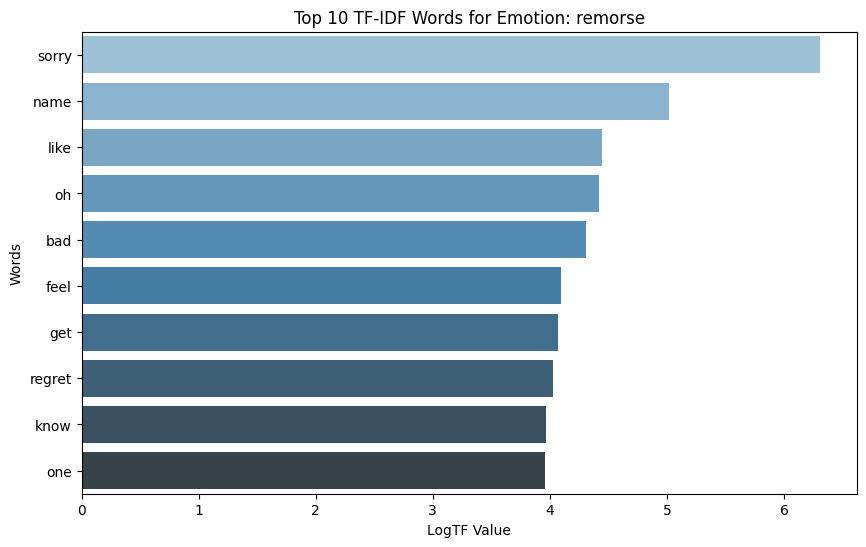

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


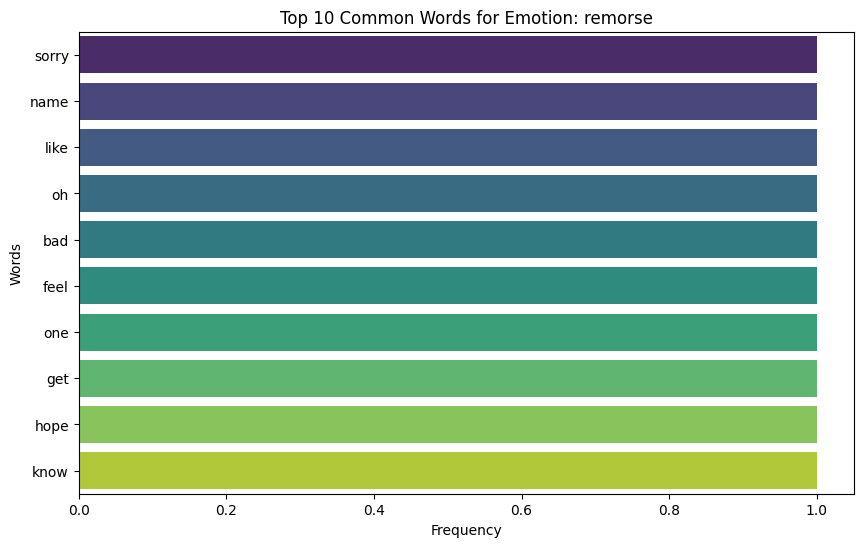

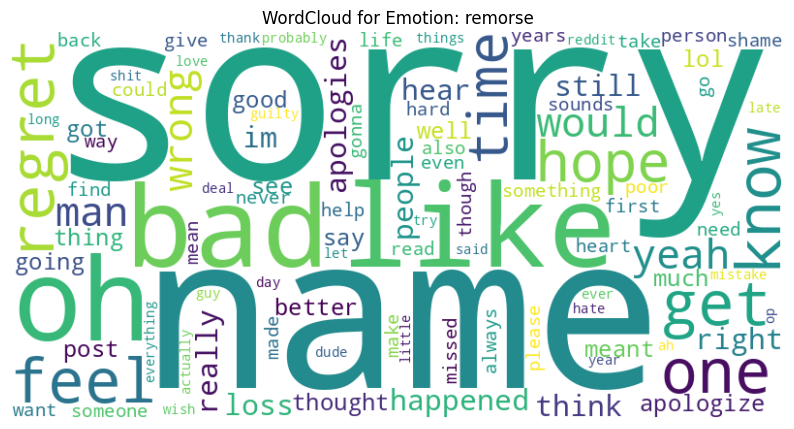

Generating plots for sadness...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


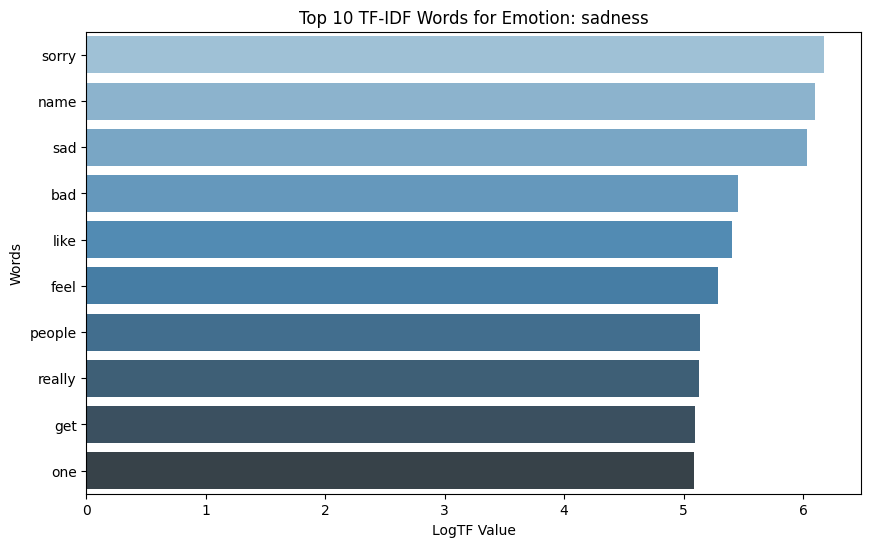

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


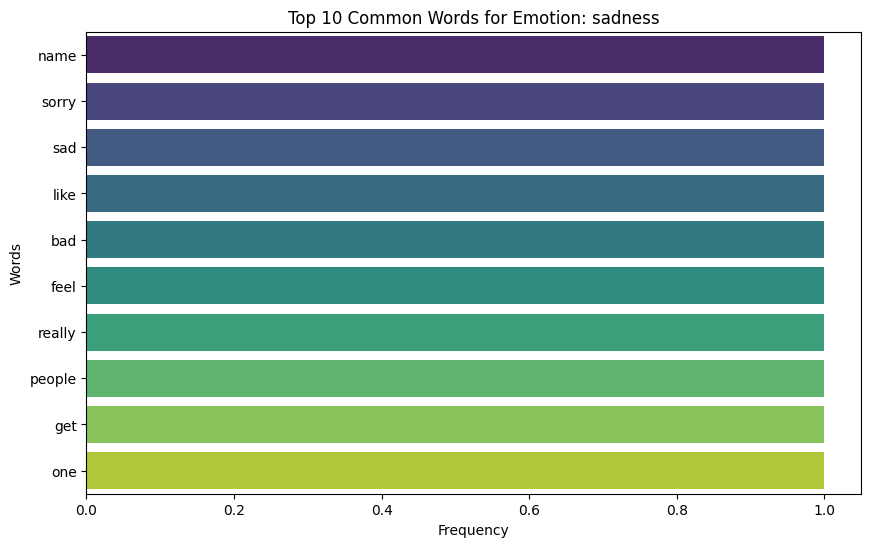

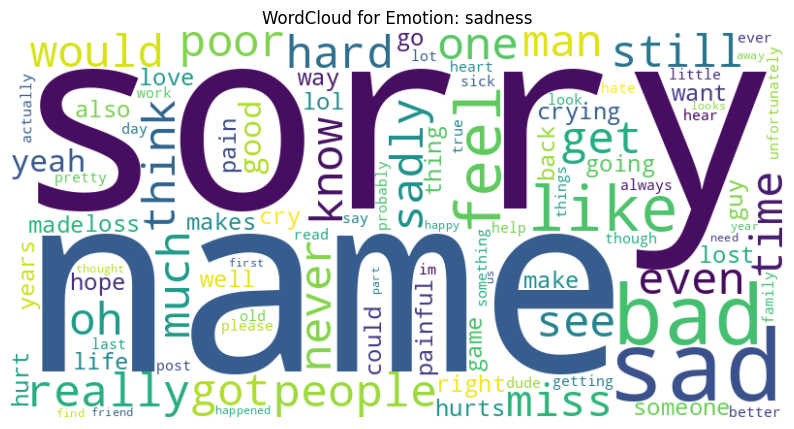

Generating plots for surprise...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


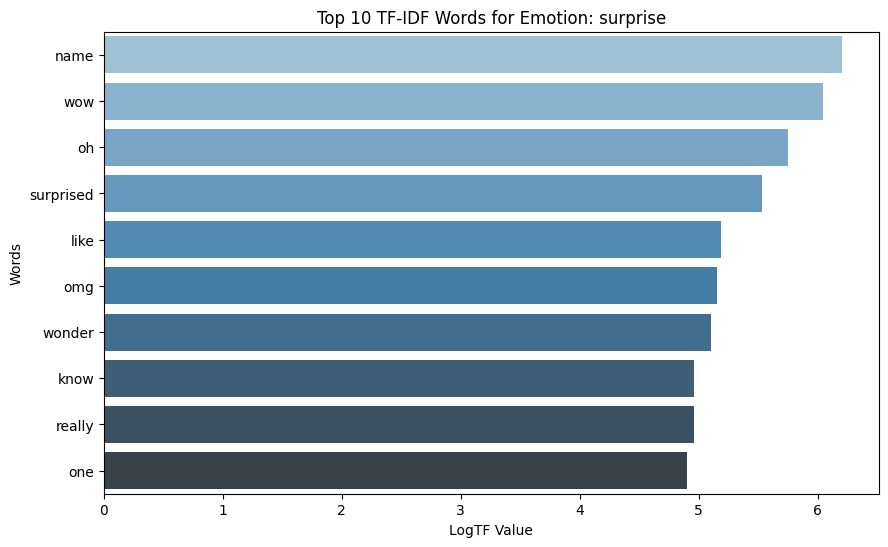

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


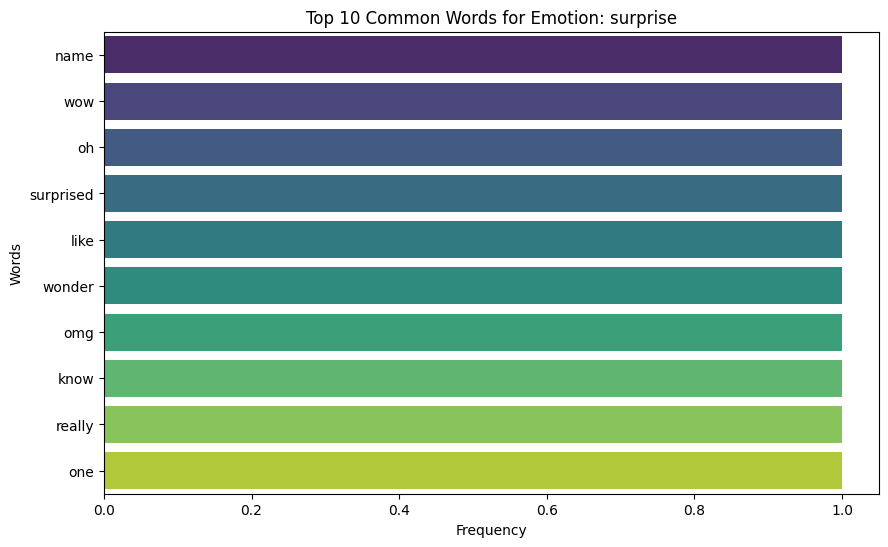

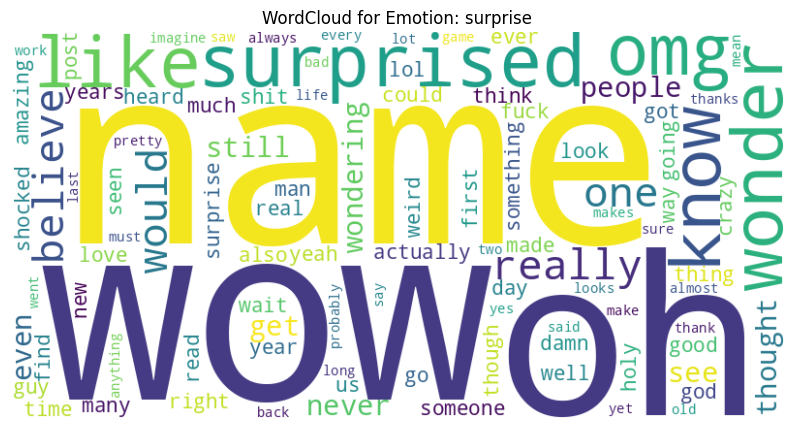

Generating plots for neutral...


<ipython-input-20-e00f4f57ac73>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


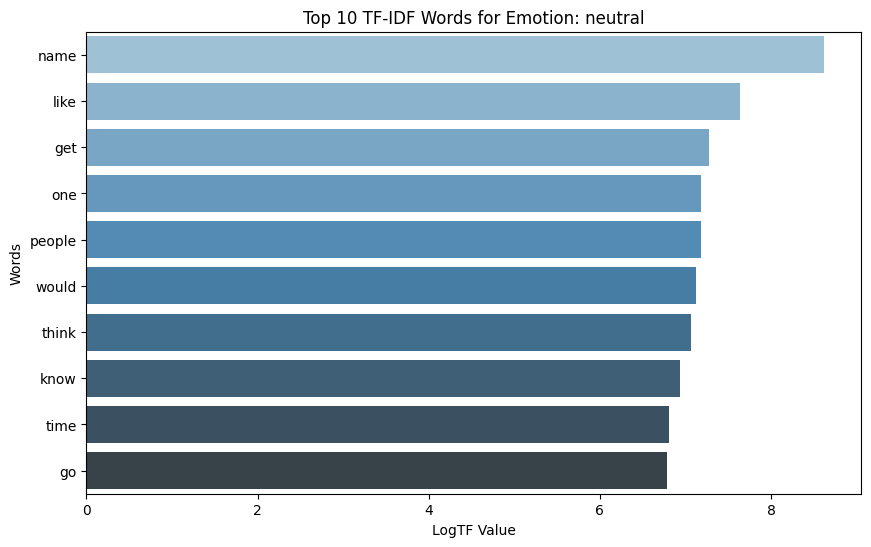

<ipython-input-20-e00f4f57ac73>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=common_words[:top_n], palette="viridis")


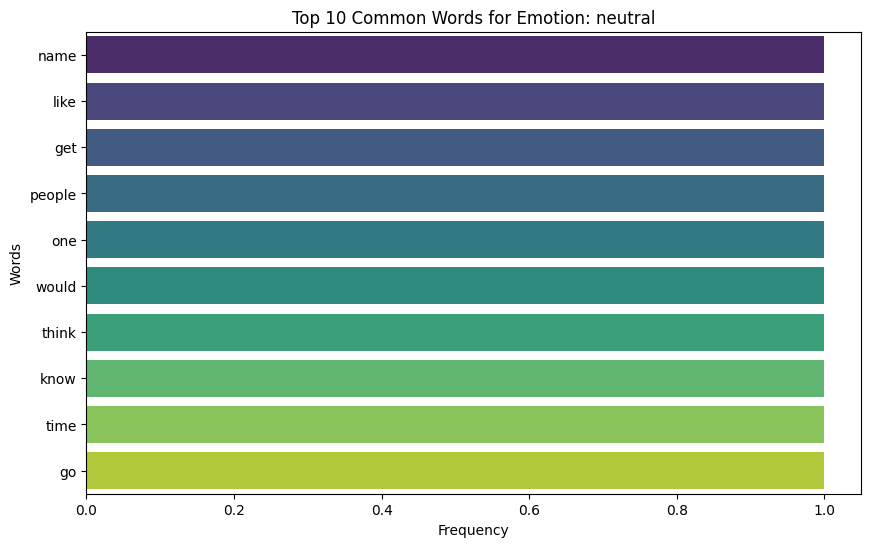

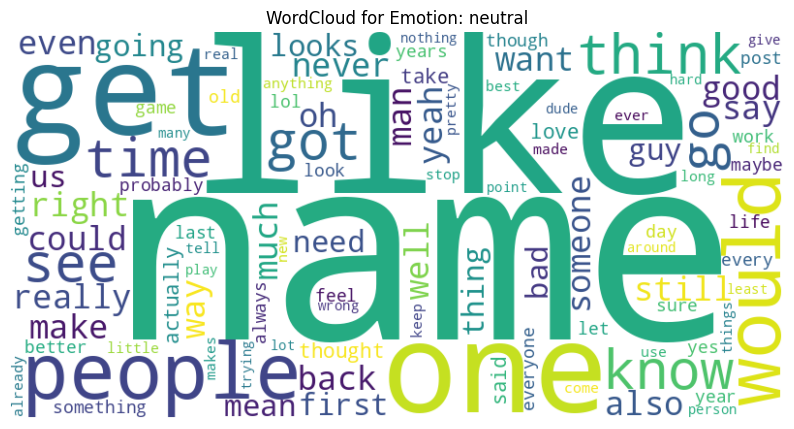

In [20]:
import json
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

def load_results_from_file(file_path):
    if os.path.exists(file_path):
        with open(file_path, 'r') as f:
            return json.load(f)
    return {}

def plot_tfidf(results, emotion, top_n=10):
    tfidf_words = results[emotion]['tfidf_words']
    log_tf_values = results[emotion]['log_tf']

    sorted_words = sorted(log_tf_values.items(), key=lambda x: x[1], reverse=True)[:top_n]
    words, scores = zip(*sorted_words)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(scores), y=list(words), palette="Blues_d")
    plt.title(f"Top {top_n} TF-IDF Words for Emotion: {emotion}")
    plt.xlabel('LogTF Value')
    plt.ylabel('Words')
    plt.show()

def plot_common_words(results, emotion, top_n=10):
    common_words = results[emotion]['common_words']

    plt.figure(figsize=(10, 6))
    sns.countplot(y=common_words[:top_n], palette="viridis")
    plt.title(f"Top {top_n} Common Words for Emotion: {emotion}")
    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.show()

def plot_wordcloud(results, emotion):
    tfidf_words = results[emotion]['tfidf_words']
    word_freq = {word: results[emotion]['log_tf'].get(word, 0) for word in tfidf_words}

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud for Emotion: {emotion}")
    plt.show()

def plot_emotion_visualizations(results, top_n=10):
    for emotion in results:
        if emotion != "all_data":
            print(f"Generating plots for {emotion}...")
            plot_tfidf(results, emotion, top_n)
            plot_common_words(results, emotion, top_n)
            plot_wordcloud(results, emotion)

results = load_results_from_file('emotion_word_metrics.json')

plot_emotion_visualizations(results, top_n=10)


Generating plots for all data...


<ipython-input-22-af06352fa04b>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(scores), y=list(words), palette="Blues_d")


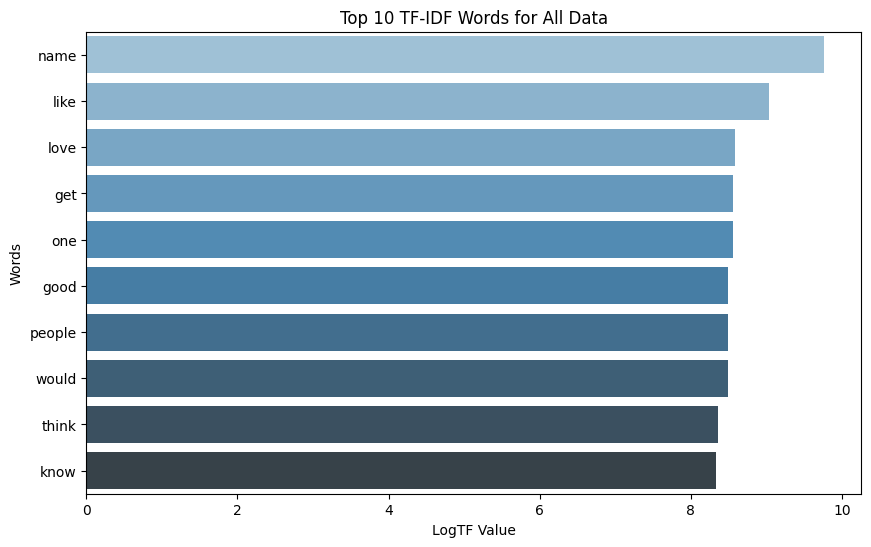

<ipython-input-22-af06352fa04b>:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=all_data_common_words[:top_n], palette="viridis")


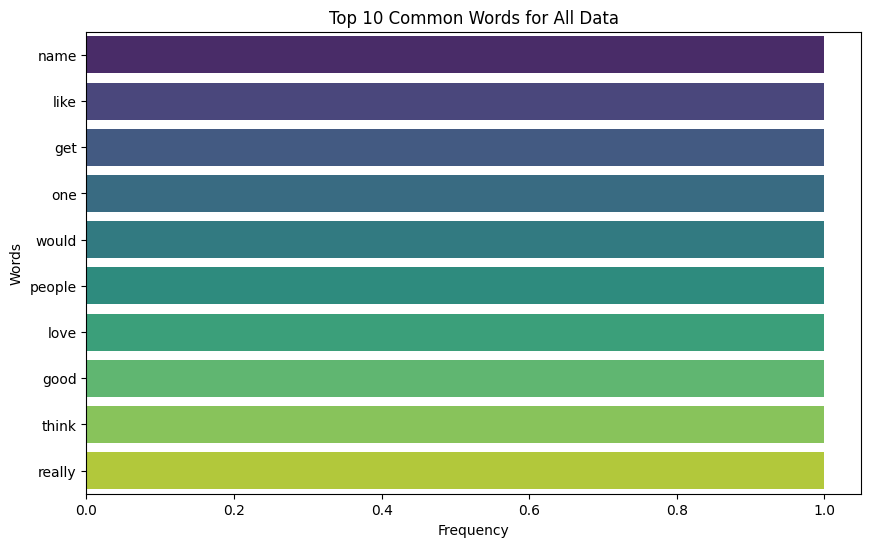

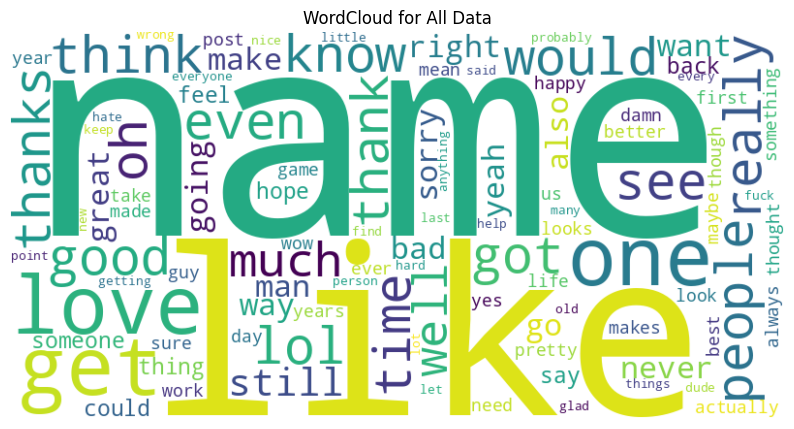

In [22]:
def plot_all_data_tfidf(results, top_n=10):
    if 'all_data' not in results:
        print("No 'all_data' found in the results.")
        return

    all_data_log_tf = results['all_data']['log_tf']

    sorted_words = sorted(all_data_log_tf.items(), key=lambda x: x[1], reverse=True)[:top_n]
    words, scores = zip(*sorted_words)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(scores), y=list(words), palette="Blues_d")
    plt.title(f"Top {top_n} TF-IDF Words for All Data")
    plt.xlabel('LogTF Value')
    plt.ylabel('Words')
    plt.show()

def plot_all_data_common_words(results, top_n=10):
    if 'all_data' not in results:
        print("No 'all_data' found in the results.")
        return

    all_data_common_words = results['all_data']['common_words']

    plt.figure(figsize=(10, 6))
    sns.countplot(y=all_data_common_words[:top_n], palette="viridis")
    plt.title(f"Top {top_n} Common Words for All Data")
    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.show()

def plot_all_data_wordcloud(results):
    if 'all_data' not in results:
        print("No 'all_data' found in the results.")
        return

    all_data_tfidf_words = results['all_data']['tfidf_words']
    word_freq = {word: results['all_data']['log_tf'].get(word, 0) for word in all_data_tfidf_words}

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title("WordCloud for All Data")
    plt.show()

def plot_all_data_visualizations(results, top_n=10):
    print("Generating plots for all data...")
    plot_all_data_tfidf(results, top_n)
    plot_all_data_common_words(results, top_n)
    plot_all_data_wordcloud(results)

results = load_results_from_file('emotion_word_metrics.json')

plot_all_data_visualizations(results, top_n=10)


הפרדה בין סטוסטים עם רגשות נטרילים לכלו בלי


neutral_df – דאטה-פריים שמכיל את כל השורות שבהן הערך בעמודת "neutral" הוא 1 (כלומר, רגשות נייטרליים).
whitout_neutral_df – דאטה-פריים שמכיל את כל השורות שבהן הערך בעמודת "neutral" הוא 0 (כלומר, לא רגשות נייטרליים).
common_ids – יוצרת סט שמכיל את ה-ID's המשותפים בין שני הדאטה-פריימים — אלו שמופיעים גם בneutral_df וגם בwhitout_neutral_df.
neutral_with_common_ids – כל השורות בneutral_df עם ה-ID's המשותפים.
whitout_neutral_with_common_ids – כל השורות בwhitout_neutral_df עם ה-ID's המשותפים.

In [23]:
neutral_df  = combined_df[combined_df['neutral'] == 1]
whitout_neutral_df  = combined_df[combined_df['neutral'] == 0]
common_ids = set(neutral_df['id']).intersection(set(whitout_neutral_df['id']))
neutral_with_common_ids = neutral_df[neutral_df['id'].isin(common_ids)]
whitout_neutral_with_common_ids = whitout_neutral_df[whitout_neutral_df['id'].isin(common_ids)]
print(neutral_df.shape,whitout_neutral_df.shape,len(common_ids))
print(f"Size of neutral_with_common_ids: {neutral_with_common_ids.shape}")
print(f"Size of whitout_neutral_with_common_ids: {whitout_neutral_with_common_ids.shape}")

(55298, 37) (155927, 37) 27786
Size of neutral_with_common_ids: (43992, 37)
Size of whitout_neutral_with_common_ids: (65503, 37)


In [42]:
import pandas as pd
import re
import numpy as np
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer

# פונקציה לעיבוד טקסט - נוריד מילים מיותרות (stopwords)
def preprocess_text(text, stop_words):
    text = re.sub(r'\W+', ' ', text)  # הסרת תווים לא רצויים
    words = text.lower().split()     # הפיכת הטקסט לאותיות קטנות וחלוקה למילים
    words = [word for word in words if word not in stop_words]  # הסרת stopwords
    return words

# טוענים את רשימת ה-stopwords
stop_words = list(stopwords.words('english'))  # המרה לרשימה

# פונקציה לביצוע חישוב עבור רגש יחיד
def compute_metrics_for_emotion(emotion, df, text_column, top_n_words=20):
    # סינון הדאטה רק עבור הרגש הספציפי
    emotion_df = df[df[emotion] == 1][text_column]

    # בדיקה אם יש נתונים לרגש
    if emotion_df.empty:
        print(f"No data for emotion: {emotion}")
        return {emotion: {'tfidf_words': [], 'common_words': [], 'log_tf': {}}}

    # עיבוד טקסטים
    processed_texts = emotion_df.apply(lambda x: preprocess_text(x, stop_words)).tolist()
    processed_texts = [' '.join(text) for text in processed_texts if text]  # ביטול טקסטים ריקים

    if len(processed_texts) == 0:
        print(f"No valid texts for emotion: {emotion}")
        return {emotion: {'tfidf_words': [], 'common_words': [], 'log_tf': {}}}

    # חישוב TF-IDF
    tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words, max_features=top_n_words)

    # בדיקה אם יש טקסטים לאחר הסינון
    if len(processed_texts) == 0:
        print(f"Skipping TF-IDF computation for {emotion} due to no valid processed text.")
        return {emotion: {'tfidf_words': [], 'common_words': [], 'log_tf': {}}}

    tfidf_matrix = tfidf_vectorizer.fit_transform(processed_texts)
    top_tfidf_words = tfidf_vectorizer.get_feature_names_out()

    # חישוב המילים הנפוצות
    common_words = get_most_common_words(processed_texts, top_n=top_n_words)

    # חישוב LogTF
    word_indices = {word: idx for idx, word in enumerate(top_tfidf_words)}
    log_tf = {word: np.log1p(tfidf_matrix[:, word_indices[word]].sum()) for word in top_tfidf_words}

    # החזרת תוצאות
    return {
        emotion: {
            'tfidf_words': list(top_tfidf_words),
            'common_words': common_words,
            'log_tf': log_tf
        }
    }

# שמירה וטעינה של תוצאות
def save_results_to_file(results, file_path):
    with open(file_path, 'w') as f:
        json.dump(results, f)

def load_results_from_file(file_path):
    if os.path.exists(file_path):
        with open(file_path, 'r') as f:
            return json.load(f)
    return {}

# עיבוד על כל הרגשות
results = load_results_from_file('whitout_neutral_emotion_word_metrics.json')
for emotion in emotion_columns:
    if emotion in results:
        print(f"Skipping {emotion}, already processed.")
        continue

    print(f"Processing emotion: {emotion}")
    emotion_result = compute_metrics_for_emotion(emotion, whitout_neutral_with_common_ids, text_column='text', top_n_words=100)
    results.update(emotion_result)

    save_results_to_file(results, 'whitout_neutral_emotion_word_metrics.json')

print("Processing all data...")
all_data_metrics = compute_metrics_for_all_data(whitout_neutral_with_common_ids, text_column='text', top_n_words=100)
results['all_data'] = all_data_metrics

save_results_to_file(results, 'whitout_neutral_emotion_word_metrics.json')

print("Processing completed.")



Processing emotion: admiration
Processing emotion: amusement
Processing emotion: anger
Processing emotion: annoyance
Processing emotion: approval
Processing emotion: caring
Processing emotion: confusion
Processing emotion: curiosity
Processing emotion: desire
Processing emotion: disappointment
Processing emotion: disapproval
Processing emotion: disgust
Processing emotion: embarrassment
Processing emotion: excitement
Processing emotion: fear
Processing emotion: gratitude
Processing emotion: grief
Processing emotion: joy
Processing emotion: love
Processing emotion: nervousness
Processing emotion: optimism
Processing emotion: pride
Processing emotion: realization
Processing emotion: relief
Processing emotion: remorse
Processing emotion: sadness
Processing emotion: surprise
Processing emotion: neutral
No data for emotion: neutral
Processing all data...
Processing completed.


In [44]:
import pandas as pd
import re
import numpy as np
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer

# פונקציה לעיבוד טקסט - נוריד מילים מיותרות (stopwords)
def preprocess_text(text, stop_words):
    text = re.sub(r'\W+', ' ', text)  # הסרת תווים לא רצויים
    words = text.lower().split()     # הפיכת הטקסט לאותיות קטנות וחלוקה למילים
    words = [word for word in words if word not in stop_words]  # הסרת stopwords
    return words

# טוענים את רשימת ה-stopwords
stop_words = list(stopwords.words('english'))  # המרה לרשימה

# פונקציה לביצוע חישוב עבור רגש יחיד
def compute_metrics_for_emotion(emotion, df, text_column, top_n_words=20):
    # סינון הדאטה רק עבור הרגש הספציפי
    emotion_df = df[df[emotion] == 1][text_column]

    # בדיקה אם יש נתונים לרגש
    if emotion_df.empty:
        print(f"No data for emotion: {emotion}")
        return {emotion: {'tfidf_words': [], 'common_words': [], 'log_tf': {}}}

    # עיבוד טקסטים
    processed_texts = emotion_df.apply(lambda x: preprocess_text(x, stop_words)).tolist()
    processed_texts = [' '.join(text) for text in processed_texts if text]  # ביטול טקסטים ריקים

    if len(processed_texts) == 0:
        print(f"No valid texts for emotion: {emotion}")
        return {emotion: {'tfidf_words': [], 'common_words': [], 'log_tf': {}}}

    # חישוב TF-IDF
    tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words, max_features=top_n_words)

    # בדיקה אם יש טקסטים לאחר הסינון
    if len(processed_texts) == 0:
        print(f"Skipping TF-IDF computation for {emotion} due to no valid processed text.")
        return {emotion: {'tfidf_words': [], 'common_words': [], 'log_tf': {}}}

    tfidf_matrix = tfidf_vectorizer.fit_transform(processed_texts)
    top_tfidf_words = tfidf_vectorizer.get_feature_names_out()

    # חישוב המילים הנפוצות
    common_words = get_most_common_words(processed_texts, top_n=top_n_words)

    # חישוב LogTF
    word_indices = {word: idx for idx, word in enumerate(top_tfidf_words)}
    log_tf = {word: np.log1p(tfidf_matrix[:, word_indices[word]].sum()) for word in top_tfidf_words}

    # החזרת תוצאות
    return {
        emotion: {
            'tfidf_words': list(top_tfidf_words),
            'common_words': common_words,
            'log_tf': log_tf
        }
    }

# שמירה וטעינה של תוצאות
def save_results_to_file(results, file_path):
    with open(file_path, 'w') as f:
        json.dump(results, f)

def load_results_from_file(file_path):
    if os.path.exists(file_path):
        with open(file_path, 'r') as f:
            return json.load(f)
    return {}

# עיבוד על כל הרגשות
results = load_results_from_file('whit_neutral_emotion_word_metrics.json')
for emotion in emotion_columns:
    if emotion in results:
        print(f"Skipping {emotion}, already processed.")
        continue

    print(f"Processing emotion: {emotion}")
    emotion_result = compute_metrics_for_emotion(emotion, neutral_with_common_ids, text_column='text', top_n_words=100)
    results.update(emotion_result)

    save_results_to_file(results, 'whit_neutral_emotion_word_metrics.json')

print("Processing all data...")
all_data_metrics = compute_metrics_for_all_data(neutral_with_common_ids, text_column='text', top_n_words=100)
results['all_data'] = all_data_metrics

save_results_to_file(results, 'whit_neutral_emotion_word_metrics.json')

print("Processing completed.")

Processing emotion: admiration
No data for emotion: admiration
Processing emotion: amusement
No data for emotion: amusement
Processing emotion: anger
No data for emotion: anger
Processing emotion: annoyance
No data for emotion: annoyance
Processing emotion: approval
No data for emotion: approval
Processing emotion: caring
No data for emotion: caring
Processing emotion: confusion
No data for emotion: confusion
Processing emotion: curiosity
No data for emotion: curiosity
Processing emotion: desire
No data for emotion: desire
Processing emotion: disappointment
No data for emotion: disappointment
Processing emotion: disapproval
No data for emotion: disapproval
Processing emotion: disgust
No data for emotion: disgust
Processing emotion: embarrassment
No data for emotion: embarrassment
Processing emotion: excitement
No data for emotion: excitement
Processing emotion: fear
No data for emotion: fear
Processing emotion: gratitude
No data for emotion: gratitude
Processing emotion: grief
No data 

##stop word

In [4]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def remove_stopwords_from_text(text):
    """
    Function to remove stopwords from the text.
    """
    # Splitting the text into words
    words = text.split()

    # Removing stopwords from the words
    cleaned_words = [word for word in words if word.lower() not in stop_words]  # using lower() to ensure case-insensitivity

    # Joining the words back into text
    return ' '.join(cleaned_words)

# Cleaning the 'text' column by removing stopwords
combined_df['text'] = combined_df['text'].apply(remove_stopwords_from_text)

# Displaying the first 10 rows after stopword removal
print(combined_df['text'].head(10))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


0                                           game hurt.
1    >sexuality shouldn’t grouping category makes d...
2                                right, care fuck 'em!
3                                     Man love reddit.
4                    [NAME] nowhere near them, Falcon.
5    Right? Considering it’s important document, kn...
6    big, he's still quite popular. I've heard thin...
7    That's crazy; went super [RELIGION] high schoo...
8                                  that's adorable asf
9    "Sponge Blurb Pubs Quaw Haha GURR ha AAa!" fin...
Name: text, dtype: object


##top 20 word popleri

Top 20 most common words:
[NAME]: 28018
like: 15183
I'm: 8677
get: 8312
would: 8062
love: 7032
one: 6869
people: 6807
think: 6753
really: 6194
know: 6004
good: 5287
see: 5088
it.: 4689
I’m: 4468
even: 4278
got: 4253
still: 4145
time: 3894
want: 3814


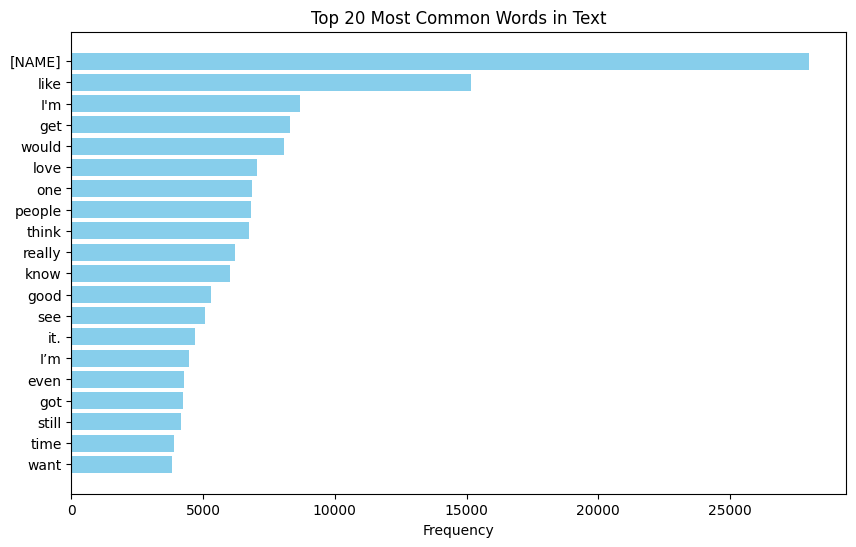

In [5]:
from collections import Counter
import matplotlib.pyplot as plt

def get_most_common_words(text_series, top_n=20):
    """
    Function to get the most common words from a pandas Series of text.
    """
    # Create a list to hold all words from the text column
    all_words = []

    # Iterate through each text in the series and split into words
    for text in text_series:
        words = text.split()
        all_words.extend(words)  # Add the words to the all_words list

    # Count the frequency of each word using Counter
    word_counts = Counter(all_words)

    # Get the top N most common words
    most_common_words = word_counts.most_common(top_n)

    return most_common_words

# Get the 20 most common words from the cleaned 'text' column
top_20_words = get_most_common_words(combined_df['text'], top_n=20)

# Display the results
print("Top 20 most common words:")
for word, count in top_20_words:
    print(f"{word}: {count}")

# Plot the top 20 words
words, counts = zip(*top_20_words)
plt.figure(figsize=(10, 6))
plt.barh(words, counts, color='skyblue')
plt.xlabel('Frequency')
plt.title('Top 20 Most Common Words in Text')
plt.gca().invert_yaxis()  # Reverse the y-axis to show the most common word on top
plt.show()


In [55]:
# def remove_common_words(text_series, common_words):
#     """
#     Function to remove the most common words from a pandas Series of text.
#     """
#     # Create a set of the most common words to remove
#     common_words_set = set([word for word, _ in common_words])

#     # Define a function to remove the common words from each text
#     def remove_words_from_text(text):
#         words = text.split()
#         filtered_words = [word for word in words if word.lower() not in common_words_set]
#         return " ".join(filtered_words)

#     # Apply this function to the text column and return the cleaned text
#     return text_series.apply(remove_words_from_text)

# # Get the 20 most common words from the cleaned 'text' column
# top_20_words = get_most_common_words(combined_df['text'], top_n=20)

# # Remove the top 20 most common words from the 'text' column
# combined_df['text'] = remove_common_words(combined_df['text'], top_20_words)
from collections import Counter
import pandas as pd

def get_most_common_words(text_series, top_n=20):
    """
    Function to get the most common words in a pandas Series of text.
    """
    # Create a Counter to count word frequencies
    all_words = ' '.join(text_series).split()
    word_counts = Counter([word.lower() for word in all_words])  # Convert to lowercase to ignore case

    # Return the most common words
    return word_counts.most_common(top_n)
def remove_common_words(text_series, common_words):
    """
    Function to remove the most common words from a pandas Series of text.
    """
    # Create a set of the most common words to remove
    common_words_set = set([word for word, _ in common_words])

    # Define a function to remove the common words from each text
    def remove_words_from_text(text):
        words = text.split()
        filtered_words = [word for word in words if word.lower() not in common_words_set]
        return " ".join(filtered_words)

    # Apply this function to the text column and return the cleaned text
    return text_series.apply(remove_words_from_text)

# Get the 20 most common words from the cleaned 'text' column
top_20_words = get_most_common_words(combined_df['text'], top_n=20)

# Remove the top 20 most common words from the 'text' column
combined_df['text'] = remove_common_words(combined_df['text'], top_20_words)

# Display the first 10 rows after removal
print(combined_df['text'].head(10))


0                                           game hurt.
1    >sexuality shouldn’t grouping category makes d...
2                                right, care fuck 'em!
3                                          Man reddit.
4                           nowhere near them, Falcon.
5    Right? Considering it’s important document, da...
6    big, he's quite popular. I've heard thing cont...
7    crazy; went super [RELIGION] high school remem...
8                                         adorable asf
9    "Sponge Blurb Pubs Quaw Haha GURR ha AAa!" fin...
Name: text, dtype: object


##Building an emotion dictionary of words and emotion

In [5]:
from collections import Counter

def get_unique_words_for_emotions(df, emotion_columns):
    """
    Function to get the most common words for each emotion category in the dataframe.
    """
    emotion_words_dict = {}

    for emotion in emotion_columns:
        # Filter the dataframe for rows where the emotion is 1
        emotion_data = df[df[emotion] == 1]

        # Get the text data for the filtered rows
        texts = emotion_data['text']

        # Get the most common words for the emotion
        most_common_words = get_most_common_words(texts)

        # Add the list of most common words to the dictionary for the emotion
        emotion_words_dict[emotion] = [word for word, _ in most_common_words]

    return emotion_words_dict


# Get the most common words for each emotion
emotion_words = get_unique_words_for_emotions(combined_df, emotion_columns)

# Display the words associated with each emotion
for emotion, words in emotion_words.items():
    print(f"Emotion: {emotion} -> Words: {words}")


NameError: name 'get_most_common_words' is not defined

ניקוי טקסט באופן מלא


In [6]:
import nltk
from nltk.corpus import stopwords
from collections import Counter
import pandas as pd

# Download stopwords if not already downloaded
nltk.download('stopwords', quiet=True)
stop_words = set(stopwords.words('english'))

def clean_text(text_series, top_n_common=20):
    """
    Function to clean text by removing stopwords and the most common words.
    """
    # Step 1: Remove stopwords from the text
    def remove_stopwords(text):
        words = text.split()
        cleaned_words = [word for word in words if word.lower() not in stop_words]
        return ' '.join(cleaned_words)

    # Apply stopword removal to the text series
    text_series = text_series.apply(remove_stopwords)

    # Step 2: Find the most common words after stopword removal
    all_words = ' '.join(text_series).split()
    common_words = Counter([word.lower() for word in all_words]).most_common(top_n_common)
    common_words_set = set([word for word, _ in common_words])

    # Step 3: Remove the most common words from each row of text
    def remove_common_words(text):
        words = text.split()
        filtered_words = [word for word in words if word.lower() not in common_words_set]
        return ' '.join(filtered_words)

    # Apply common word removal to the text series
    return text_series.apply(remove_common_words)

# Clean the 'text' column in the DataFrame
combined_df['text'] = clean_text(combined_df['text'], top_n_common=20)

# Display the first 10 rows after cleaning
print(combined_df['text'].head(10))


0                                           game hurt.
1    >sexuality shouldn’t grouping category makes d...
2                                right, care fuck 'em!
3                                          Man reddit.
4                           nowhere near them, Falcon.
5    Right? Considering it’s important document, da...
6    big, he's quite popular. I've heard thing cont...
7    crazy; went super [RELIGION] high school remem...
8                                         adorable asf
9    "Sponge Blurb Pubs Quaw Haha GURR ha AAa!" fin...
Name: text, dtype: object


In [8]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(max_features=5000)
X_tfidf = tfidf_vectorizer.fit_transform(combined_df['text'])
X_tfidf

<211225x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 1145312 stored elements in Compressed Sparse Row format>

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_tfidf, combined_df[emotion_columns], test_size=0.2, random_state=42)


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier

model = LogisticRegression(max_iter=1000)
ovr_model = OneVsRestClassifier(model)
ovr_model.fit(X_train, y_train)


OneVsRestClassifier(estimator=LogisticRegression(max_iter=1000))

In [ ]:
from sklearn.metrics import classification_report

y_pred = ovr_model.predict(X_test)
print(classification_report(y_test, y_pred, target_names=emotion_columns))


                precision    recall  f1-score   support

    admiration       0.67      0.26      0.37      3456
     amusement       0.58      0.28      0.38      1891
         anger       0.49      0.08      0.14      1628
     annoyance       0.33      0.02      0.03      2722
      approval       0.63      0.03      0.05      3418
        caring       0.49      0.03      0.07      1147
     confusion       0.59      0.03      0.05      1463
     curiosity       0.73      0.04      0.07      1941
        desire       0.43      0.06      0.11       758
disappointment       0.58      0.01      0.03      1671
   disapproval       0.52      0.01      0.02      2289
       disgust       0.59      0.07      0.12      1074
 embarrassment       0.56      0.04      0.07       502
    excitement       0.56      0.05      0.10      1121
          fear       0.57      0.15      0.23       625
     gratitude       0.84      0.47      0.60      2330
         grief       0.50      0.03      0.05  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

##Logistic Regression model

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report
import pandas as pd

X = combined_df['text']  # The text data
y = combined_df[emotion_columns]  # Emotion columns as target labels (binary for each emotion)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a TfidfVectorizer to convert the text into feature vectors
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=5000)

# Fit and transform the training data
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Create a Logistic Regression model
model = LogisticRegression(max_iter=1000)

# Use OneVsRestClassifier to handle multi-label classification
ovr_model = OneVsRestClassifier(model)

# Train the model on the training data
ovr_model.fit(X_train_tfidf, y_train)

# Make predictions on the test data
y_pred = ovr_model.predict(X_test_tfidf)

# Measure the model's performance
print(classification_report(y_test, y_pred))

# Function to predict the emotion of a new text
def predict_emotion(text):
    # Transform the new text into TF-IDF
    text_tfidf = tfidf_vectorizer.transform([text])
    # Predict the emotion for the new text (multi-label, hence an array of binary results)
    prediction = ovr_model.predict(text_tfidf)
    # Get emotions with a non-zero prediction
    predicted_emotions = [emotion_columns[i] for i in range(len(prediction[0])) if prediction[0][i] == 1]
    return predicted_emotions

# Example prediction
new_text = "I had a fight with a friend who hurt me"
print(f"The predicted emotions for the text are: {predict_emotion(new_text)}")

              precision    recall  f1-score   support

           0       0.66      0.25      0.37      3456
           1       0.58      0.29      0.39      1891
           2       0.49      0.09      0.15      1628
           3       0.32      0.02      0.03      2722
           4       0.63      0.03      0.05      3418
           5       0.40      0.04      0.07      1147
           6       0.58      0.03      0.06      1463
           7       0.79      0.03      0.06      1941
           8       0.39      0.05      0.09       758
           9       0.59      0.02      0.03      1671
          10       0.45      0.01      0.01      2289
          11       0.61      0.06      0.11      1074
          12       0.56      0.05      0.09       502
          13       0.59      0.05      0.10      1121
          14       0.56      0.14      0.23       625
          15       0.87      0.41      0.56      2330
          16       0.30      0.03      0.05       115
          17       0.48    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

In [ ]:
_pred = ovr_model.predict(X_test_tfidf)

# Print the classification report for model evaluation
print("Classification Report on Test Data:")
print(classification_report(y_test, y_pred))

# Optionally, print predicted emotions for the first few test samples
def display_predictions(X_test, y_test, y_pred, num_samples=10):
    print(f"\nDisplaying predictions for the first {num_samples} test samples:")
    for i in range(num_samples):
        print(f"\nSample {i+1}:")
        print(f"Text: {X_test.iloc[i]}")
        print(f"True Emotions: {y_test.iloc[i].values}")
        predicted_emotions = [emotion_columns[j] for j in range(len(y_pred[i])) if y_pred[i][j] == 1]
        print(f"Predicted Emotions: {predicted_emotions}")

# Displaying the predictions for the first 10 samples in the test set
display_predictions(X_test, y_test, y_pred, num_samples=10)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.65      0.27      0.39      3456
           1       0.59      0.30      0.40      1891
           2       0.51      0.10      0.17      1628
           3       0.32      0.02      0.03      2722
           4       0.57      0.03      0.05      3418
           5       0.41      0.03      0.06      1147
           6       0.57      0.04      0.07      1463
           7       0.82      0.04      0.07      1941
           8       0.43      0.06      0.11       758
           9       0.58      0.01      0.03      1671
          10       0.41      0.01      0.02      2289
          11       0.60      0.07      0.12      1074
          12       0.59      0.06      0.11       502
          13       0.57      0.05      0.09      1121
          14       0.55      0.15      0.23       625
          15       0.89      0.70      0.79      2330
          16       0.30      0.03      0.05  

##LSTM

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Embedding, Dropout
from sklearn.preprocessing import MultiLabelBinarizer

# המרת הטקסט לטוקנים
X = combined_df['text']  # הטקסט
y = combined_df[emotion_columns]  # רגשות כטורגים בינאריים

# המרת רגשות ל-MultiLabel Binarization
mlb = MultiLabelBinarizer()
y = mlb.fit_transform(y.values)

# פיצול הנתונים
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Tokenization - המרת הטקסטים למספרים
tokenizer = Tokenizer(num_words=5000, lower=True)
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

# Padding - יצירת אורך אחיד לכל הטקסטים
max_sequence_length = 100  # גודל המקסימום של רצפים
X_train_pad = pad_sequences(X_train_seq, maxlen=max_sequence_length)
X_test_pad = pad_sequences(X_test_seq, maxlen=max_sequence_length)

# בניית המודל LSTM
model = Sequential()
model.add(Embedding(input_dim=5000, output_dim=100, input_length=max_sequence_length))
model.add(LSTM(units=64, return_sequences=False))
model.add(Dropout(0.5))
model.add(Dense(units=y.shape[1], activation='sigmoid'))  # Sigmoid ליצירת פלט של multi-label
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# סיכום המודל
model.summary()

# אימון המודל
history = model.fit(X_train_pad, y_train, epochs=5, batch_size=64, validation_data=(X_test_pad, y_test))

# הערכת המודל על סט הנתונים
score, accuracy = model.evaluate(X_test_pad, y_test)
print(f"Test accuracy: {accuracy * 100:.2f}%")

# חיזוי רגשות על טקסטים חדשים
def predict_emotion_lstm(text):
    # המרת הטקסט לאינדקסים ואז לארך אחיד
    text_seq = tokenizer.texts_to_sequences([text])
    text_pad = pad_sequences(text_seq, maxlen=max_sequence_length)
    prediction = model.predict(text_pad)
    # בחירת רגשות עם ערכים גבוהים
    predicted_emotions = [emotion_columns[i] for i in range(len(prediction[0])) if prediction[0][i] >= 0.5]
    return predicted_emotions

# דוגמה לחיזוי רגשות
new_text = "I feel really happy today!"
print(f"The predicted emotions for the text are: {predict_emotion_lstm(new_text)}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/5
2641/2641 ━━━━━━━━━━━━━━━━━━━━ 389s 146ms/step - accuracy: 0.9640 - loss: 0.0581 - val_accuracy: 1.0000 - val_loss: 0.0405
Epoch 2/5
2641/2641 ━━━━━━━━━━━━━━━━━━━━ 417s 137ms/step - accuracy: 1.0000 - loss: 0.0388 - val_accuracy: 1.0000 - val_loss: 0.0412
Epoch 3/5
2641/2641 ━━━━━━━━━━━━━━━━━━━━ 379s 136ms/step - accuracy: 1.0000 - loss: 0.0340 - val_accuracy: 1.0000 - val_loss: 0.0433
Epoch 4/5
2641/2641 ━━━━━━━━━━━━━━━━━━━━ 355s 134ms/step - accuracy: 1.0000 - loss: 0.0310 - val_accuracy: 1.0000 - val_loss: 0.0450
Epoch 5/5
2641/2641 ━━━━━━━━━━━━━━━━━━━━ 353s 134ms/step - accuracy: 1.0000 - loss: 0.0284 - val_accuracy: 1.0000 - val_loss: 0.0477
1321/1321 ━━━━━━━━━━━━━━━━━━━━ 24s 18ms/step - accuracy: 1.0000 - loss: 0.0452
Test accuracy: 100.00%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
The predicted emotions for the text are: ['admiration', 'amusement']


In [ ]:
# הערכת המודל על סט הבדיקה
score, accuracy = model.evaluate(X_test_pad, y_test)
print(f"Test accuracy: {accuracy * 100:.2f}%")


1321/1321 ━━━━━━━━━━━━━━━━━━━━ 24s 18ms/step - accuracy: 1.0000 - loss: 0.0452
Test accuracy: 100.00%


In [ ]:
from sklearn.metrics import classification_report

# חיזוי על כל הדגימות בסט הבדיקה
y_pred = model.predict(X_test_pad)

# חישוב מדדים כמו precision, recall ו-F1-score
# כי מדובר בבעיה multi-label, נשתמש ב- classification_report כדי לראות את התוצאות לכל רגשות

# המרת החיזויים והערכים האמיתיים בצורה בינארית (אם הערך מעל 0.5, נסמן כ-1, אחרת כ-0)
y_pred_bin = (y_pred >= 0.5).astype(int)

# הצגת דיווח על הביצועים
print(classification_report(y_test, y_pred_bin, target_names=emotion_columns))


1321/1321 ━━━━━━━━━━━━━━━━━━━━ 24s 18ms/step


ValueError: Number of classes, 2, does not match size of target_names, 28. Try specifying the labels parameter

In [ ]:
classification_report(y_test , y_pred_bin)

'              precision    recall  f1-score   support\n\n           0       1.00      1.00      1.00     42245\n           1       0.98      1.00      0.99     41555\n\n   micro avg       0.99      1.00      1.00     83800\n   macro avg       0.99      1.00      1.00     83800\nweighted avg       0.99      1.00      1.00     83800\n samples avg       0.99      1.00      0.99     83800\n'

LLM

In [7]:
!pip install transformers torch


In [14]:
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification

# טוענים את ה-tokenizer והמודל של DistilBERT
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=len(emotion_columns))


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [9]:
import torch
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset




X_train, X_test, y_train, y_test = train_test_split(combined_df['text'], combined_df[emotion_columns], test_size=0.2, random_state=42)


def encode_text(texts):

    return tokenizer(texts.tolist(), padding=True, truncation=True, max_length=512, return_tensors='pt')

def create_data_loader(texts, labels, batch_size=16):
    encoded_inputs = encode_text(texts)
    input_ids = encoded_inputs['input_ids']
    attention_mask = encoded_inputs['attention_mask']
    labels = torch.tensor(labels.values, dtype=torch.float32)


    dataset = TensorDataset(input_ids, attention_mask, labels)
    return DataLoader(dataset, batch_size=batch_size)


train_dataloader = create_data_loader(X_train, y_train, batch_size=8)
test_dataloader = create_data_loader(X_test, y_test)



NameError: name 'tokenizer' is not defined

In [10]:
!nvidia-smi


/bin/bash: line 1: nvidia-smi: command not found


In [16]:
train_dataloader

In [17]:
test_dataloader

In [18]:
from torch.optim import AdamW
from torch.cuda.amp import autocast, GradScaler

# הגדרת האופטימייזר
optimizer = AdamW(model.parameters(), lr=2e-5)

# אם יש לך GPU, העבר את המודל אליו
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

scaler = GradScaler()

# פונקציה לאימון המודל
def train(model, dataloader, optimizer, epochs=3):
    model.train()
    for epoch in range(epochs):
        for batch in dataloader:
            input_ids = batch[0].to(device)
            attention_mask = batch[1].to(device)
            labels = batch[2].to(device)

            optimizer.zero_grad()

            # משתמש ב-AMP (16 ביטים) כדי להאיץ את האימון
            with autocast():  # הפעלת AMP בלי device_type
                outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
                loss = outputs.loss

            # מבצע Scaling על הגרדיאנט לפני עדכון המשקלים
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            print(f'Epoch {epoch+1}, Loss: {loss.item()}')

# התחלת האימון
train(model, train_dataloader, optimizer)





<ipython-input-18-5db8e53367e9>:11: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
<ipython-input-18-5db8e53367e9>:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # הפעלת AMP בלי device_type


Streaming output truncated to the last 5000 lines.
Epoch 3, Loss: 0.08506380766630173
Epoch 3, Loss: 0.09082061797380447
Epoch 3, Loss: 0.14038079977035522
Epoch 3, Loss: 0.09429726004600525
Epoch 3, Loss: 0.08439537137746811
Epoch 3, Loss: 0.09417159110307693
Epoch 3, Loss: 0.09536924213171005
Epoch 3, Loss: 0.09392618387937546
Epoch 3, Loss: 0.08605004847049713
Epoch 3, Loss: 0.12935087084770203
Epoch 3, Loss: 0.08817562460899353
Epoch 3, Loss: 0.12774355709552765
Epoch 3, Loss: 0.09910126775503159
Epoch 3, Loss: 0.1313774585723877
Epoch 3, Loss: 0.08511199802160263
Epoch 3, Loss: 0.11259449273347855
Epoch 3, Loss: 0.15795683860778809
Epoch 3, Loss: 0.15987688302993774
Epoch 3, Loss: 0.09141547977924347
Epoch 3, Loss: 0.13600552082061768
Epoch 3, Loss: 0.12453713268041611
Epoch 3, Loss: 0.07517747581005096
Epoch 3, Loss: 0.16322341561317444
Epoch 3, Loss: 0.12866263091564178
Epoch 3, Loss: 0.09630576521158218
Epoch 3, Loss: 0.11384131759405136
Epoch 3, Loss: 0.105709508061409
Epoch 3

In [26]:
from sklearn.metrics import classification_report

# פונקציה להערכת המודל
def evaluate_multilabel(model, dataloader, threshold=0.5):
    model.eval()  # מצב הערכה
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch[0].to(device)
            attention_mask = batch[1].to(device)
            labels = batch[2].to(device)

            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            probs = torch.sigmoid(outputs.logits)  # שימוש ב-sigmoid עבור רב-תוויות
            preds = (probs > threshold).int()  # קביעת חיזויים לפי סף

            all_preds.append(preds.cpu().numpy())
            all_labels.append(labels.cpu().numpy())

    # ממירים את הרשימות למערכים
    all_preds = np.vstack(all_preds)
    all_labels = np.vstack(all_labels)

    # יצירת דוח הערכה
    report = classification_report(all_labels, all_preds, target_names=emotion_columns, zero_division=0)
    return report


# הערכת המודל לאחר האימון
print(evaluate_multilabel(model, test_dataloader))



                precision    recall  f1-score   support

    admiration       0.62      0.44      0.52      3456
     amusement       0.55      0.37      0.45      1891
         anger       0.50      0.12      0.20      1628
     annoyance       0.60      0.02      0.04      2722
      approval       0.45      0.09      0.15      3418
        caring       0.48      0.04      0.08      1147
     confusion       0.48      0.09      0.15      1463
     curiosity       0.46      0.16      0.23      1941
        desire       0.43      0.16      0.24       758
disappointment       0.49      0.06      0.10      1671
   disapproval       0.41      0.05      0.08      2289
       disgust       0.50      0.15      0.23      1074
 embarrassment       0.55      0.16      0.25       502
    excitement       0.52      0.08      0.14      1121
          fear       0.50      0.34      0.41       625
     gratitude       0.79      0.65      0.71      2330
         grief       0.22      0.02      0.03  

In [25]:
def predict_emotion(text):
    model.eval()  # מצב הערכה
    encoded_input = tokenizer([text], padding=True, truncation=True, max_length=512, return_tensors='pt')  # אין צורך ב-tolist
    with torch.no_grad():
        outputs = model(input_ids=encoded_input['input_ids'].to(device),
                        attention_mask=encoded_input['attention_mask'].to(device))
        preds = torch.argmax(outputs.logits, dim=1)
        predicted_emotions = [emotion_columns[i] for i in preds.cpu().numpy()]
    return predicted_emotions

# דוגמת חיזוי
new_text = "i woke up very tired today. i didn't do much but i think tomorrow might be better"
print(f"The predicted emotions for the text are: {predict_emotion(new_text)}")


The predicted emotions for the text are: ['nervousness']


In [31]:
import torch.nn.functional as F

def predict_emotion_with_probabilities(text):
    model.eval()  # מצב הערכה
    # קידוד הטקסט
    encoded_input = tokenizer([text], padding=True, truncation=True, max_length=512, return_tensors='pt')
    with torch.no_grad():
        # חיזוי
        outputs = model(input_ids=encoded_input['input_ids'].to(device),
                        attention_mask=encoded_input['attention_mask'].to(device))
        probabilities = F.softmax(outputs.logits, dim=1)  # חישוב הסתברויות עם softmax

        # ממירים את ההסתברויות למילון עם שמות הרגשות
        emotion_probs = {emotion_columns[i]: prob for i, prob in enumerate(probabilities[0].cpu().numpy())}

    return emotion_probs

# דוגמת חיזוי
# new_text = "i woke up very tired today. i didn't do much but i think tomorrow might be better"
new_text = "i am black"

emotion_probabilities = predict_emotion_with_probabilities(new_text)

# הצגת התוצאות
print("Emotion probabilities:")
for emotion, prob in emotion_probabilities.items():
    print(f"{emotion}: {prob:.2%}")


Emotion probabilities:
admiration: 0.08%
amusement: 0.55%
anger: 3.63%
annoyance: 2.46%
approval: 2.52%
caring: 0.03%
confusion: 0.11%
curiosity: 0.09%
desire: 0.07%
disappointment: 0.28%
disapproval: 1.61%
disgust: 2.51%
embarrassment: 0.55%
excitement: 0.29%
fear: 0.29%
gratitude: 0.09%
grief: 0.04%
joy: 0.07%
love: 0.38%
nervousness: 0.15%
optimism: 0.05%
pride: 0.06%
realization: 0.27%
relief: 0.02%
remorse: 0.04%
sadness: 0.46%
surprise: 0.59%
neutral: 82.70%


In [22]:
import pickle

# נתיב שמירה
save_path = "emotion_distilbert_model1.pkl"

# שמירת המודל כקובץ pkl
with open(save_path, "wb") as f:
    pickle.dump(model.state_dict(), f)

print(f"Model saved as {save_path}")

# טעינת המודל מקובץ pkl
with open(save_path, "rb") as f:
    loaded_state_dict = pickle.load(f)

# טוענים את המשקלים לתוך המודל
model.load_state_dict(loaded_state_dict)

print("Model loaded successfully from pkl file!")


Model saved as emotion_distilbert_model1.pkl
Model loaded successfully from pkl file!


In [28]:
# נתיב שמירה
save_path = "emotion_distilbert_model_and_tokenizer1.pkl"

# שמירת המודל וה-tokenizer
with open(save_path, "wb") as f:
    pickle.dump({
        "model_state_dict": model.state_dict(),
        "tokenizer": tokenizer
    }, f)

print(f"Model and tokenizer saved as {save_path}")

# טעינת המודל וה-tokenizer מקובץ pkl
with open(save_path, "rb") as f:
    saved_data = pickle.load(f)

# טוענים את המשקלים לתוך המודל
model.load_state_dict(saved_data["model_state_dict"])

# טוענים את ה-tokenizer
tokenizer = saved_data["tokenizer"]

print("Model and tokenizer loaded successfully from pkl file!")


Model and tokenizer saved as emotion_distilbert_model_and_tokenizer1.pkl
Model and tokenizer loaded successfully from pkl file!


In [35]:
!ls

data  emotion_distilbert_model1.pkl  emotion_distilbert_model_and_tokenizer1.pkl  sample_data


In [36]:
!ls /path/to/directory


ls: cannot access '/path/to/directory': No such file or directory


In [37]:
from google.colab import files

files.download('emotion_distilbert_model1.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [38]:
from google.colab import drive
drive.mount('/content/drive')

# העברת הקובץ ל-Google Drive
!cp emotion_distilbert_model1.pkl /content/drive/MyDrive/


Mounted at /content/drive


In [39]:
!cp emotion_distilbert_model_and_tokenizer1.pkl /content/drive/MyDrive/


###RoBERTa

In [8]:
from transformers import RobertaTokenizer, RobertaForSequenceClassification

model_name = "roberta-base"
tokenizer = RobertaTokenizer.from_pretrained(model_name)
model = RobertaForSequenceClassification.from_pretrained(model_name, num_labels=28)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [9]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=1)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
         

In [10]:
import torch
from transformers import RobertaTokenizer, RobertaForSequenceClassification
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from torch.optim import AdamW
from torch.cuda.amp import autocast, GradScaler

# טוקניזר של Roberta
tokenizer = RobertaTokenizer.from_pretrained("roberta-base")

# פונקציות עיבוד
def encode_text(texts):
    return tokenizer(texts.tolist(), padding=True, truncation=True, max_length=512, return_tensors='pt')

def create_data_loader(texts, labels, batch_size=16):
    encoded_inputs = encode_text(texts)
    input_ids = encoded_inputs['input_ids']
    attention_mask = encoded_inputs['attention_mask']
    labels = torch.tensor(labels.values, dtype=torch.float32)

    dataset = TensorDataset(input_ids, attention_mask, labels)
    return DataLoader(dataset, batch_size=batch_size)

# חילוק הנתונים
X_train, X_test, y_train, y_test = train_test_split(combined_df['text'], combined_df[emotion_columns], test_size=0.2, random_state=42)

# יצירת DataLoader עבור האימון והבדיקה
train_dataloader = create_data_loader(X_train, y_train, batch_size=4)
test_dataloader = create_data_loader(X_test, y_test, batch_size=4)


In [ ]:
from transformers import RobertaTokenizer, RobertaForSequenceClassification
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
import torch
from torch.optim import AdamW
from torch.cuda.amp import autocast, GradScaler



model = RobertaForSequenceClassification.from_pretrained("roberta-base", num_labels=len(emotion_columns))

# אם יש לך GPU, העבר את המודל אליו
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# הגדרת האופטימיזר
optimizer = AdamW(model.parameters(), lr=2e-5)

# אופטימיזר ודחיית גרדיאנט
scaler = GradScaler()

# הגדרת מספר הצעדים להצטברות גרדיאנט
accumulation_steps = 4  # לצבור 4 בatches לפני עדכון המשקלים

# פונקציה לאימון המודל
def train(model, dataloader, optimizer, epochs=3):
    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()  # אתחול של הגרדיאנט לפני תחילת האימון
        for i, batch in enumerate(dataloader):
            input_ids = batch[0].to(device)  # העברת הנתונים ל-GPU
            attention_mask = batch[1].to(device)  # העברת הנתונים ל-GPU
            labels = batch[2].to(device)  # העברת הנתונים ל-GPU

            # משתמש ב-AMP (16 ביטים) כדי להאיץ את האימון
            with autocast():
                outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
                loss = outputs.loss

            # מחשבים את הגרדיאנטים ומצברים אותם
            scaler.scale(loss).backward()

            # אם עברנו את מספר ה-batches שצברנו, מבצעים עדכון
            if (i + 1) % accumulation_steps == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()  # אתחול מחדש של הגרדיאנט

            print(f'Epoch {epoch+1}, Batch {i+1}, Loss: {loss.item()}')

        torch.cuda.empty_cache()  # שחרור זיכרון לאחר כל epoch

# התחלת האימון
train(model, train_dataloader, optimizer)


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
<ipython-input-11-4bc5c43e182f>:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/usr/local/lib/python3.10/dist-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(
<ipython-input-11-4bc5c43e182f>:36: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/usr/local/lib/python3.10/dist-packages/torch/amp/autocast_mode.py:266: UserWarning: User provide

Epoch 1, Batch 1, Loss: 0.7001411318778992
Epoch 1, Batch 2, Loss: 0.6969698071479797
Epoch 1, Batch 3, Loss: 0.7008040547370911
Epoch 1, Batch 4, Loss: 0.6968901753425598
Epoch 1, Batch 5, Loss: 0.6850993037223816
Epoch 1, Batch 6, Loss: 0.6909993290901184
Epoch 1, Batch 7, Loss: 0.685369074344635
Epoch 1, Batch 8, Loss: 0.6940011978149414
Epoch 1, Batch 9, Loss: 0.6795164942741394
Epoch 1, Batch 10, Loss: 0.6720060706138611
Epoch 1, Batch 11, Loss: 0.6883856654167175
Epoch 1, Batch 12, Loss: 0.6776348948478699
Epoch 1, Batch 13, Loss: 0.6757334470748901
Epoch 1, Batch 14, Loss: 0.6640170216560364
Epoch 1, Batch 15, Loss: 0.6795014142990112
Epoch 1, Batch 16, Loss: 0.6614280343055725
Epoch 1, Batch 17, Loss: 0.647490918636322
Epoch 1, Batch 18, Loss: 0.6496791839599609
Epoch 1, Batch 19, Loss: 0.6667230725288391
Epoch 1, Batch 20, Loss: 0.666326642036438
Epoch 1, Batch 21, Loss: 0.6612342000007629
Epoch 1, Batch 22, Loss: 0.6639580130577087
Epoch 1, Batch 23, Loss: 0.6689955592155457


###ALBERT

In [ ]:
from transformers import AlbertTokenizer, AlbertForSequenceClassification

model_name = "albert-base-v2"
tokenizer = AlbertTokenizer.from_pretrained(model_name)
model = AlbertForSequenceClassification.from_pretrained(model_name)


###XLNet

In [ ]:
from transformers import XLNetTokenizer, XLNetForSequenceClassification

model_name = "xlnet-base-cased"
tokenizer = XLNetTokenizer.from_pretrained(model_name)
model = XLNetForSequenceClassification.from_pretrained(model_name)


###T5 (Text-to-Text Transfer Transformer)

In [ ]:
from transformers import T5Tokenizer, T5ForConditionalGeneration

model_name = "t5-small"
tokenizer = T5Tokenizer.from_pretrained(model_name)
model = T5ForConditionalGeneration.from_pretrained(model_name)


###GPT-2

In [ ]:
from transformers import GPT2Tokenizer, GPT2LMHeadModel

model_name = "gpt2"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)


###ELECTRA

In [ ]:
from transformers import ElectraTokenizer, ElectraForSequenceClassification

model_name = "electra-base-discriminator"
tokenizer = ElectraTokenizer.from_pretrained(model_name)
model = ElectraForSequenceClassification.from_pretrained(model_name)


### BART (Bidirectional and Auto-Regressive Transformers)


In [ ]:
from transformers import BartTokenizer, BartForSequenceClassification

model_name = "facebook/bart-base"
tokenizer = BartTokenizer.from_pretrained(model_name)
model = BartForSequenceClassification.from_pretrained(model_name)


### DeBERTa (Decoding-enhanced BERT with disentangled attention)


In [ ]:
from transformers import DebertaTokenizer, DebertaForSequenceClassification

model_name = "microsoft/deberta-base"
tokenizer = DebertaTokenizer.from_pretrained(model_name)
model = DebertaForSequenceClassification.from_pretrained(model_name)


###BERTweet

In [ ]:
from transformers import BertTokenizer, BertForSequenceClassification

model_name = "vinai/bertweet-base"
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertForSequenceClassification.from_pretrained(model_name)
